# YOLOv12 with Physics-Informed Denoising for MRI Brain Tumor Detection
This notebook implements an enhanced YOLOv12 object detection framework with physics-informed denoising for robust MRI brain tumor classification. The model addresses the challenging task of detecting tumors in noisy MRI scans by incorporating domain-specific knowledge of MRI physics.
## Key Innovations:

1. Physics-Informed Denoising Pipeline: Incorporates k-space transformations to model how noise manifests in the MRI acquisition process, rather than treating denoising purely in the image domain.
2. Adaptive Noise Estimation: Dynamically estimates noise characteristics on a per-image basis, allowing the model to handle varying levels of noise corruption.
3. MRI-Specific Enhancement: Custom contrast enhancement for improved tumor visibility in brain tissue.
4. Robust Classification: Detects and classifies four categories (Glioma, Meningioma, No Tumor, Pituitary) with high precision even under significant noise conditions.
5. Quantitative Evaluation: Comprehensive PSNR (Peak Signal-to-Noise Ratio) analysis across multiple noise types (Rician, Gaussian, Speckle) and intensities to validate denoising performance.

This work demonstrates significant advances in medical image analysis by bridging deep learning object detection with MRI physics principles, resulting in more reliable tumor detection in realistic clinical scenarios.

Dataset link: https://universe.roboflow.com/ali-rostami/labeled-mri-brain-tumor-dataset/dataset/1

In [1]:
%%capture
!pip install ultralytics
!curl -L "https://universe.roboflow.com/ds/woT4oIxhT3?key=W97eM1zukk" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

In [2]:
!mkdir dataset

In [4]:
!mv test train valid dataset

In [14]:
%%writefile mri_physics_denoising.py
"""
MRI-Physics-Informed Denoising Module
Incorporates k-space processing, adaptive noise estimation, and contrast enhancement
"""

import torch
import torch.nn as nn
import torch.nn.functional as F

class KSpaceTransformModule(nn.Module):
    """MRI physics-informed module that operates in k-space domain"""

    def __init__(self, channels):
        super(KSpaceTransformModule, self).__init__()
        self.channels = channels

        # Learnable k-space filters (real and imaginary components)
        self.kspace_filter_real = nn.Parameter(torch.ones(channels, 1, 3, 3))
        self.kspace_filter_imag = nn.Parameter(torch.zeros(channels, 1, 3, 3))

        # Initialize with identity-like transform
        nn.init.dirac_(self.kspace_filter_real)

    def forward(self, x):
        batch, c, h, w = x.shape

        # Treat image as real part of complex signal
        x_real = x
        x_imag = torch.zeros_like(x)

        # Convert to k-space via FFT
        # Combine real and imaginary parts into complex tensor
        x_complex = torch.complex(x_real, x_imag)

        # Perform 2D FFT to get to k-space
        k_space = torch.fft.fft2(x_complex)

        # Split into real and imaginary for processing
        k_real = k_space.real
        k_imag = k_space.imag

        # Apply learnable filtering in k-space (using separable operations for efficiency)
        # Process each channel separately for efficiency
        k_real_filtered = torch.zeros_like(k_real)  # Changed from modifying in-place
        k_imag_filtered = torch.zeros_like(k_imag)  # Changed from modifying in-place

        for i in range(self.channels):
            k_real_filtered[:,i:i+1] = F.conv2d(
                k_real[:,i:i+1],
                self.kspace_filter_real[i:i+1],
                padding=1
            )
            k_imag_filtered[:,i:i+1] = F.conv2d(
                k_imag[:,i:i+1],
                self.kspace_filter_imag[i:i+1],
                padding=1
            )

        # Recombine filtered components
        k_filtered = torch.complex(k_real_filtered, k_imag_filtered)

        # Convert back to image space via IFFT
        x_filtered = torch.fft.ifft2(k_filtered).real

        # Residual connection for stability - avoid in-place addition
        return x + 0.1 * x_filtered  # Scale down effect for stability


class AdaptiveNoiseEstimator(nn.Module):
    """Adaptive noise estimation module that predicts noise characteristics"""

    def __init__(self, channels, features=16):
        super(AdaptiveNoiseEstimator, self).__init__()

        # Lightweight noise estimation network
        self.encoder = nn.Sequential(
            nn.Conv2d(channels, features, kernel_size=3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=False),  # Changed inplace to False
            nn.Conv2d(features, features, kernel_size=3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=False)   # Changed inplace to False
        )

        # Global noise level prediction
        self.level_predictor = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Conv2d(features, channels, kernel_size=1),
            nn.Sigmoid()  # Normalize to 0-1 range
        )

        # Noise pattern prediction
        self.pattern_predictor = nn.Sequential(
            nn.Conv2d(features, features, kernel_size=3, padding=1),
            nn.LeakyReLU(0.2, inplace=False),  # Changed inplace to False
            nn.Conv2d(features, channels, kernel_size=1)
        )

    def forward(self, x):
        # Extract features
        features = self.encoder(x)

        # Predict global noise level
        noise_level = self.level_predictor(features)

        # Predict noise pattern
        pattern = self.pattern_predictor(features)
        pattern = F.interpolate(pattern, size=x.shape[2:], mode='bilinear', align_corners=False)

        return pattern, noise_level


class ContrastEnhancementModule(nn.Module):
    """Self-supervised contrast enhancement module"""

    def __init__(self, channels, features=32):
        super(ContrastEnhancementModule, self).__init__()

        # Edge detection filters
        self.edge_filters = nn.Conv2d(channels, features, kernel_size=3, padding=1, bias=False)
        nn.init.xavier_uniform_(self.edge_filters.weight)

        # Contrast map generator
        self.contrast_generator = nn.Sequential(
            nn.Conv2d(features, features, kernel_size=3, padding=1),
            nn.LeakyReLU(0.2, inplace=False),  # Changed inplace to False
            nn.Conv2d(features, channels, kernel_size=1),
            nn.Tanh()  # Output in [-1,1] range to allow both enhancement and reduction
        )

    def forward(self, x):
        # Extract edge features
        edge_features = self.edge_filters(x)

        # Generate contrast adjustment map
        contrast_map = self.contrast_generator(edge_features)

        # Apply contrast adjustment (multiplicative) - avoid in-place operation
        enhanced = x * (1 + contrast_map * 0.1)  # Limit adjustment range for stability

        return enhanced


class MRIPHYSNet(nn.Module):
    """
    MRI-Physics-Informed Adaptive Denoising Network
    Integrates k-space processing, adaptive noise estimation, and contrast enhancement
    """

    def __init__(self, channels=3, features=64):
        super(MRIPHYSNet, self).__init__()

        # Initial feature extraction
        self.init_conv = nn.Sequential(
            nn.Conv2d(channels, features, kernel_size=3, padding=1),
            nn.LeakyReLU(0.2, inplace=False)  # Changed inplace to False
        )

        # K-space transform module
        self.kspace_module = KSpaceTransformModule(features)

        # Adaptive noise estimator
        self.noise_estimator = AdaptiveNoiseEstimator(features)

        # Main denoising blocks
        self.denoise_blocks = nn.ModuleList([
            nn.Sequential(
                nn.Conv2d(features, features, kernel_size=3, padding=1),
                nn.BatchNorm2d(features),
                nn.LeakyReLU(0.2, inplace=False)  # Changed inplace to False
            ) for _ in range(4)  # Reduced number of blocks for speed
        ])

        # Contrast enhancement
        self.contrast_enhancer = ContrastEnhancementModule(features)

        # Output layer
        self.output = nn.Conv2d(features, channels, kernel_size=3, padding=1)

        # Initialize with small weights for stable residual learning
        nn.init.xavier_normal_(self.output.weight, gain=0.1)

    def forward(self, x):
        # Original input for residual connection
        x_input = x

        # Initial features
        x = self.init_conv(x)

        # Apply k-space transformation
        x = self.kspace_module(x)

        # Estimate noise characteristics
        noise_pattern, noise_level = self.noise_estimator(x)

        # Apply main denoising blocks with adaptive noise suppression
        for block in self.denoise_blocks:
            block_output = block(x)
            # Apply adaptive noise suppression (scaled by global noise level)
            # Avoid in-place modification
            x = block_output - noise_pattern * noise_level

        # Apply contrast enhancement
        x = self.contrast_enhancer(x)

        # Predict residual noise
        noise = self.output(x)

        # Subtract noise from input (residual learning)
        denoised = x_input - noise

        # Ensure valid range
        denoised = torch.clamp(denoised, 0.0, 1.0)

        return denoised

Overwriting mri_physics_denoising.py


In [5]:
%%writefile denoising_module.py
"""
Denoising module optimized for MRI images
"""
import torch
import torch.nn as nn

# Import the MRI-Physics model
from mri_physics_denoising import MRIPHYSNet

class DnCNN(nn.Module):
    """
    Denoising Convolutional Neural Network (DnCNN)
    Optimized for medical imaging
    """

    def __init__(self, channels=3, num_layers=17, num_features=64):
        """
        Initialize the DnCNN model.

        Args:
            channels (int): Number of input/output channels (3 for RGB, 1 for grayscale)
            num_layers (int): Number of convolutional layers
            num_features (int): Number of feature maps in hidden layers
        """
        super(DnCNN, self).__init__()

        # Define layers
        layers = []

        # First layer: Conv + ReLU
        layers.append(nn.Conv2d(in_channels=channels, out_channels=num_features,
                                kernel_size=3, padding=1, bias=False))
        layers.append(nn.ReLU(inplace=True))

        # Middle layers: Conv + BN + ReLU
        for _ in range(num_layers - 2):
            layers.append(nn.Conv2d(in_channels=num_features, out_channels=num_features,
                                   kernel_size=3, padding=1, bias=False))
            layers.append(nn.BatchNorm2d(num_features))
            layers.append(nn.ReLU(inplace=True))

        # Last layer: Conv (to predict the noise)
        layers.append(nn.Conv2d(in_channels=num_features, out_channels=channels,
                               kernel_size=3, padding=1, bias=False))

        # Create sequential model
        self.dncnn = nn.Sequential(*layers)

    def forward(self, x):
        """
        Forward pass of the DnCNN model.

        Args:
            x (torch.Tensor): Input noisy image tensor

        Returns:
            torch.Tensor: Denoised image tensor
        """
        # Predict the noise component
        noise = self.dncnn(x)

        # Subtract the predicted noise from the input (residual learning)
        denoised = x - noise

        # Add clipping to ensure valid range
        denoised = torch.clamp(denoised, 0.0, 1.0)

        return denoised

class MRIDenoisingNet(nn.Module):
    """
    Denoising network specifically optimized for MRI images.
    Uses a deeper architecture with dilated convolutions for better noise removal.
    """

    def __init__(self, channels=3, num_features=64):
        super(MRIDenoisingNet, self).__init__()

        # First convolutional block
        self.conv1 = nn.Sequential(
            nn.Conv2d(channels, num_features, kernel_size=3, padding=1, bias=False),
            nn.ReLU(inplace=True)
        )

        # Middle blocks with dilated convolutions for larger receptive field
        # Reduced dilation to 1 to minimize edge artifacts
        self.dilated_blocks = nn.ModuleList([
            nn.Sequential(
                nn.ReflectionPad2d(1),  # Use reflection padding instead
                nn.Conv2d(num_features, num_features, kernel_size=3, dilation=1, bias=False),
                nn.BatchNorm2d(num_features),
                nn.ReLU(inplace=True)
            ) for _ in range(5)
        ])

        # Standard convolutional blocks
        self.conv_blocks = nn.ModuleList([
            nn.Sequential(
                nn.Conv2d(num_features, num_features, kernel_size=3, padding=1, bias=False),
                nn.BatchNorm2d(num_features),
                nn.ReLU(inplace=True)
            ) for _ in range(8)
        ])

        # Output layer
        self.output = nn.Conv2d(num_features, channels, kernel_size=3, padding=1, bias=False)

        # Initialize output layer with smaller weights
        nn.init.xavier_normal_(self.output.weight, gain=0.1)

    def forward(self, x):
        # Extract features
        x_input = x
        x = self.conv1(x)

        # Apply dilated convolutions
        for block in self.dilated_blocks:
            x = block(x)

        # Apply standard convolutions
        for block in self.conv_blocks:
            x = block(x)

        # Predict noise and subtract from input
        noise = self.output(x)
        denoised = x_input - noise

        # CRITICAL: Add proper clipping to ensure values stay in valid range
        denoised = torch.clamp(denoised, 0.0, 1.0)

        return denoised

# MRIPHYSNet is already defined in the imported module

Writing denoising_module.py


In [6]:
%%writefile yolo_denoising.py
"""
YOLOv12 with Denoising Integration for MRI Images
"""

import torch
import torch.nn as nn
from ultralytics import YOLO
from ultralytics.nn.tasks import DetectionModel
from pathlib import Path
import yaml

# Import our denoising module
from denoising_module import DnCNN, MRIDenoisingNet

class DenoisingYOLO(YOLO):
    """
    Enhanced YOLO class with integrated denoising capability for MRI images
    """

    def __init__(self, model='yolo12n.pt', denoiser_type='dncnn', denoiser=None,
                denoiser_channels=3, denoiser_layers=17, denoiser_features=64):
        """
        Initialize the DenoisingYOLO model.

        Args:
            model (str): Path to YOLO model or model name
            denoiser_type (str): Type of denoiser to use ('dncnn' or 'mri')
            denoiser (nn.Module, optional): Custom denoiser module
            denoiser_channels (int): Input/output channels for denoiser
            denoiser_layers (int): Number of layers in denoiser
            denoiser_features (int): Number of feature maps in denoiser
        """
        # Initialize parent YOLO class
        super().__init__(model)

        # Initialize denoiser
        if denoiser is None:
            if denoiser_type.lower() == 'dncnn':
                self.denoiser = DnCNN(channels=denoiser_channels,
                                     num_layers=denoiser_layers,
                                     num_features=denoiser_features)
            elif denoiser_type.lower() == 'mri':
                self.denoiser = MRIDenoisingNet(channels=denoiser_channels,
                                              num_features=denoiser_features)
            else:
                raise ValueError(f"Unknown denoiser type: {denoiser_type}")
        else:
            self.denoiser = denoiser

        # Track additional attributes
        self.denoiser_type = denoiser_type

        # Modify the model to include denoising
        self._integrate_denoiser()

    def _integrate_denoiser(self):
        """Modify the YOLO model to include the denoising module"""
        # Create a sequential model that includes the denoiser
        original_model = self.model

        if hasattr(original_model, 'model') and isinstance(original_model.model, nn.Sequential):
            # Create a new sequential model with the denoiser at the beginning
            new_model = nn.Sequential(
                self.denoiser,
                *list(original_model.model)
            )
            # Replace the model's sequential part
            original_model.model = new_model
        else:
            # Wrap the entire model with our denoiser
            self.model = nn.Sequential(
                self.denoiser,
                original_model
            )

    def train_denoiser(self, train_loader, val_loader=None, epochs=50, lr=1e-3, device=None):
        """
        Train just the denoising module separately.

        Args:
            train_loader (DataLoader): DataLoader for training data (clean, noisy pairs)
            val_loader (DataLoader, optional): DataLoader for validation
            epochs (int): Number of epochs to train
            lr (float): Learning rate
            device (str): Device to train on (e.g., 'cuda', 'cpu')

        Returns:
            dict: Training statistics
        """
        # Set device
        if device is None:
            device = 'cuda' if torch.cuda.is_available() else 'cpu'

        # Move denoiser to device
        self.denoiser = self.denoiser.to(device)

        # Set denoiser to training mode
        self.denoiser.train()

        # Define loss function and optimizer
        criterion = nn.MSELoss()
        optimizer = torch.optim.Adam(self.denoiser.parameters(), lr=lr)

        # Training loop
        for epoch in range(epochs):
            # Training phase
            epoch_loss = 0.0
            for clean_img, noisy_img in train_loader:
                # Move to device
                clean_img, noisy_img = clean_img.to(device), noisy_img.to(device)

                # Zero gradients
                optimizer.zero_grad()

                # Forward pass
                denoised_img = self.denoiser(noisy_img)
                loss = criterion(denoised_img, clean_img)

                # Backward pass and optimize
                loss.backward()
                optimizer.step()

                epoch_loss += loss.item()

            # Print progress
            print(f'Epoch [{epoch+1}/{epochs}], Loss: {epoch_loss/len(train_loader):.6f}')

            # Validation if provided
            if val_loader is not None:
                self.denoiser.eval()
                val_loss = 0.0
                with torch.no_grad():
                    for clean_img, noisy_img in val_loader:
                        clean_img, noisy_img = clean_img.to(device), noisy_img.to(device)
                        denoised_img = self.denoiser(noisy_img)
                        loss = criterion(denoised_img, clean_img)
                        val_loss += loss.item()

                print(f'Validation Loss: {val_loss/len(val_loader):.6f}')

                # Set back to training mode
                self.denoiser.train()

        return {'final_loss': epoch_loss/len(train_loader)}

    def save_denoiser(self, path):
        """Save only the denoiser weights"""
        torch.save(self.denoiser.state_dict(), path)
        print(f"Denoiser saved to {path}")

    def load_denoiser(self, path):
        """Load denoiser weights"""
        self.denoiser.load_state_dict(torch.load(path))
        print(f"Denoiser loaded from {path}")
        return self

    def predict(self, source=None, stream=False, **kwargs):
        """
        Modified predict method to first denoise images and then pass to YOLO
        """
        # Regular YOLO prediction but with denoising already integrated in the model
        return super().predict(source=source, stream=stream, **kwargs)

Writing yolo_denoising.py


In [7]:
%%writefile train_denoising_yolo.py
"""
Train YOLOv12 with Denoising on MRI Brain Tumor Dataset
"""

import os
import argparse
import yaml
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import numpy as np
from PIL import Image
import cv2
from tqdm import tqdm
import matplotlib.pyplot as plt
from pathlib import Path

# Import our custom modules
from yolo_denoising import DenoisingYOLO

class MRIDenoisingDataset(Dataset):
    """Dataset for MRI denoising with synthetic noise"""

    def __init__(self, image_dir, noise_type='gaussian', noise_level=15.0, transform=None):
        """
        Initialize the dataset.

        Args:
            image_dir (str): Directory containing images
            noise_type (str): Type of noise to add ('gaussian', 'rician', 'speckle')
            noise_level (float): Standard deviation of noise
            transform (callable): Transforms to apply to images
        """
        self.image_dir = image_dir
        self.noise_type = noise_type
        self.noise_level = noise_level
        self.transform = transform

        # Get list of image files
        self.image_files = [f for f in os.listdir(image_dir)
                           if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]

    def __len__(self):
        return len(self.image_files)

    def add_rician_noise(self, img_tensor, noise_level):
        """Add Rician noise (common in MRI) to an image tensor"""
        # Rician noise is the square root of the sum of squares of two Gaussian distributions
        noise_real = torch.randn_like(img_tensor) * (noise_level / 255.0)
        noise_imag = torch.randn_like(img_tensor) * (noise_level / 255.0)

        # Apply noise
        noisy_real = img_tensor + noise_real
        noisy_imag = noise_imag

        # Rician noise magnitude
        noisy_img = torch.sqrt(noisy_real**2 + noisy_imag**2)

        return torch.clamp(noisy_img, 0.0, 1.0)

    def add_speckle_noise(self, img_tensor, noise_level):
        """Add speckle noise (multiplicative) to an image tensor"""
        noise = torch.randn_like(img_tensor) * (noise_level / 255.0)
        noisy_img = img_tensor + img_tensor * noise
        return torch.clamp(noisy_img, 0.0, 1.0)

    def __getitem__(self, idx):
        # Load image
        img_path = os.path.join(self.image_dir, self.image_files[idx])
        img = Image.open(img_path).convert('RGB')

        # Apply transforms if provided
        if self.transform:
            img = self.transform(img)

        # Generate noisy version based on noise type
        if self.noise_type == 'gaussian':
            noise = torch.randn_like(img) * (self.noise_level / 255.0)
            noisy_img = img + noise
            noisy_img = torch.clamp(noisy_img, 0.0, 1.0)
        elif self.noise_type == 'rician':
            noisy_img = self.add_rician_noise(img, self.noise_level)
        elif self.noise_type == 'speckle':
            noisy_img = self.add_speckle_noise(img, self.noise_level)
        else:
            raise ValueError(f"Unknown noise type: {self.noise_type}")

        return img, noisy_img

def parse_args():
    """Parse command line arguments"""
    parser = argparse.ArgumentParser(description='Train YOLOv12 with Denoising for MRI Images')

    # Dataset parameters
    parser.add_argument('--data_yaml', type=str, default='data.yaml',
                        help='Path to data.yaml file')

    # Training parameters
    parser.add_argument('--output_dir', type=str, default='runs/denoising_yolo_mri',
                        help='Output directory for saving models')
    parser.add_argument('--yolo_model', type=str, default='yolo12n.pt',
                        help='Base YOLO model to use')
    parser.add_argument('--batch_size', type=int, default=8,
                        help='Batch size for training')
    parser.add_argument('--img_size', type=int, default=640,
                        help='Image size for training')
    parser.add_argument('--pretrain_denoiser', action='store_true',
                        help='Whether to pretrain the denoiser')
    parser.add_argument('--denoiser_type', type=str, default='mri',
                        choices=['dncnn', 'mri'],
                        help='Type of denoiser to use')
    parser.add_argument('--denoiser_epochs', type=int, default=30,
                        help='Number of epochs for denoiser pretraining')
    parser.add_argument('--noise_type', type=str, default='rician',
                        choices=['gaussian', 'rician', 'speckle'],
                        help='Type of noise to add during training')
    parser.add_argument('--noise_level', type=float, default=15.0,
                        help='Noise level for synthetic noise')
    parser.add_argument('--yolo_epochs', type=int, default=100,
                        help='Number of epochs for YOLO training')

    return parser.parse_args()

def main():
    # Parse arguments
    args = parse_args()

    # Create output directory
    os.makedirs(args.output_dir, exist_ok=True)

    # Load data configuration
    with open(args.data_yaml, 'r') as f:
        data_config = yaml.safe_load(f)

    # Create DenoisingYOLO model
    print(f"Creating DenoisingYOLO model with base model {args.yolo_model} and {args.denoiser_type} denoiser")
    model = DenoisingYOLO(model=args.yolo_model, denoiser_type=args.denoiser_type)

    # Pretrain the denoiser if requested
    if args.pretrain_denoiser:
        print(f"Pretraining denoiser for {args.denoiser_epochs} epochs with {args.noise_type} noise...")

        # Get training images directory
        train_dir = data_config['train']

        # Create transform
        transform = transforms.Compose([
            transforms.Resize((args.img_size, args.img_size)),
            transforms.ToTensor(),
        ])

        # Create dataset and dataloader
        denoising_dataset = MRIDenoisingDataset(
            image_dir=train_dir,
            noise_type=args.noise_type,
            noise_level=args.noise_level,
            transform=transform
        )

        denoising_loader = DataLoader(
            denoising_dataset,
            batch_size=args.batch_size,
            shuffle=True,
            num_workers=2
        )

        # Train the denoiser
        model.train_denoiser(
            train_loader=denoising_loader,
            epochs=args.denoiser_epochs,
            lr=1e-3,
            device='cuda' if torch.cuda.is_available() else 'cpu'
        )

        # Save pretrained denoiser
        denoiser_path = os.path.join(args.output_dir, 'pretrained_denoiser.pt')
        model.save_denoiser(denoiser_path)

    # Train the full model
    print(f"Training complete model for {args.yolo_epochs} epochs...")

    # Configure training parameters
    train_args = {
        'data': args.data_yaml,
        'epochs': args.yolo_epochs,
        'imgsz': args.img_size,
        'batch': args.batch_size,
        'name': Path(args.output_dir).name,
        'project': str(Path(args.output_dir).parent),
        'device': '0' if torch.cuda.is_available() else 'cpu',
        'patience': 50,  # Higher patience for medical datasets
        'cos_lr': True,  # Use cosine learning rate scheduler
        'dropout': 0.2,  # Add dropout for better generalization
    }

    # Train the model
    model.train(**train_args)

    print(f"Training completed. Final model saved in {args.output_dir}")

if __name__ == "__main__":
    main()

Writing train_denoising_yolo.py


In [8]:
%%writefile test_denoising_yolo.py
"""
Test YOLOv12 with Denoising for MRI Brain Tumor Dataset
"""

import os
import argparse
import torch
import torch.nn as nn
import numpy as np
import cv2
from PIL import Image
import matplotlib.pyplot as plt
from pathlib import Path
import yaml

# Import our custom modules
from yolo_denoising import DenoisingYOLO

def parse_args():
    """Parse command line arguments"""
    parser = argparse.ArgumentParser(description='Test YOLOv12 with Denoising for MRI Images')

    # Model parameters
    parser.add_argument('--model_path', type=str, required=True,
                        help='Path to trained model')
    parser.add_argument('--denoiser_path', type=str, default=None,
                        help='Path to pretrained denoiser (if separate)')
    parser.add_argument('--denoiser_type', type=str, default='mri',
                        choices=['dncnn', 'mri'],
                        help='Type of denoiser used')

    # Test parameters
    parser.add_argument('--test_images', type=str, default=None,
                        help='Path to test images directory')
    parser.add_argument('--output_dir', type=str, default='results',
                        help='Output directory for saving results')
    parser.add_argument('--img_size', type=int, default=640,
                        help='Image size for inference')
    parser.add_argument('--batch_size', type=int, default=8,
                        help='Batch size for inference')
    parser.add_argument('--conf', type=float, default=0.25,
                        help='Confidence threshold')
    parser.add_argument('--add_noise', action='store_true',
                        help='Add synthetic noise to test images')
    parser.add_argument('--noise_type', type=str, default='rician',
                        choices=['gaussian', 'rician', 'speckle'],
                        help='Type of noise to add')
    parser.add_argument('--noise_level', type=float, default=15.0,
                        help='Noise level for synthetic noise')
    parser.add_argument('--visualize_denoising', action='store_true',
                        help='Visualize denoising effect')
    parser.add_argument('--compare_baseline', action='store_true',
                        help='Compare with baseline YOLO model')

    return parser.parse_args()

def add_mri_noise(image, noise_type='rician', noise_level=15.0):
    """Add realistic MRI noise to an image"""
    if isinstance(image, torch.Tensor):
        # For torch tensor
        if noise_type == 'gaussian':
            noise = torch.randn_like(image) * (noise_level / 255.0)
            noisy_image = image + noise
            return torch.clamp(noisy_image, 0.0, 1.0)
        elif noise_type == 'rician':
            noise_real = torch.randn_like(image) * (noise_level / 255.0)
            noise_imag = torch.randn_like(image) * (noise_level / 255.0)
            noisy_real = image + noise_real
            noisy_imag = noise_imag
            noisy_image = torch.sqrt(noisy_real**2 + noisy_imag**2)
            return torch.clamp(noisy_image, 0.0, 1.0)
        elif noise_type == 'speckle':
            noise = torch.randn_like(image) * (noise_level / 255.0)
            noisy_image = image + image * noise
            return torch.clamp(noisy_image, 0.0, 1.0)
    else:
        # For numpy array
        if noise_type == 'gaussian':
            noise = np.random.normal(0, noise_level, image.shape).astype(np.float32)
            noisy_image = image.astype(np.float32) + noise
            return np.clip(noisy_image, 0, 255).astype(image.dtype)
        elif noise_type == 'rician':
            noise_real = np.random.normal(0, noise_level, image.shape).astype(np.float32)
            noise_imag = np.random.normal(0, noise_level, image.shape).astype(np.float32)
            noisy_real = image.astype(np.float32) + noise_real
            noisy_imag = noise_imag
            noisy_image = np.sqrt(noisy_real**2 + noisy_imag**2)
            return np.clip(noisy_image, 0, 255).astype(image.dtype)
        elif noise_type == 'speckle':
            noise = np.random.normal(0, noise_level/255, image.shape).astype(np.float32)
            noisy_image = image.astype(np.float32) + image.astype(np.float32) * noise
            return np.clip(noisy_image, 0, 255).astype(image.dtype)

    raise ValueError(f"Unknown noise type: {noise_type}")

def visualize_denoising_effect(model, image_path, output_path, noise_type='rician', noise_level=15.0):
    """Visualize denoising effect on a single image"""
    # Load image
    img = Image.open(image_path).convert('RGB')
    img_np = np.array(img)

    # Add noise
    noisy_img_np = add_mri_noise(img_np, noise_type, noise_level)

    # Convert to tensor
    img_tensor = torch.from_numpy(img_np.transpose(2, 0, 1)).float() / 255.0
    noisy_img_tensor = torch.from_numpy(noisy_img_np.transpose(2, 0, 1)).float() / 255.0

    # Add batch dimension
    img_tensor = img_tensor.unsqueeze(0)
    noisy_img_tensor = noisy_img_tensor.unsqueeze(0)

    # Move to device
    device = next(model.parameters()).device
    img_tensor = img_tensor.to(device)
    noisy_img_tensor = noisy_img_tensor.to(device)

    # Apply denoising
    with torch.no_grad():
        if hasattr(model, 'denoiser'):
            denoised_img_tensor = model.denoiser(noisy_img_tensor)
        else:
            # For Sequential model where denoiser is the first module
            denoised_img_tensor = model[0](noisy_img_tensor)

    # Convert back to numpy
    noisy_img_np_vis = (noisy_img_tensor.squeeze().cpu().permute(1, 2, 0).numpy() * 255).astype(np.uint8)
    denoised_img_np = (denoised_img_tensor.squeeze().cpu().permute(1, 2, 0).numpy() * 255).astype(np.uint8)

    # Create visualization
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(img_np)
    plt.title('Original MRI')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(noisy_img_np_vis)
    plt.title(f'Noisy MRI ({noise_type.capitalize()} noise)')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(denoised_img_np)
    plt.title('Denoised MRI')
    plt.axis('off')

    # Save figure
    os.makedirs(os.path.dirname(output_path), exist_ok=True)
    plt.savefig(output_path)
    plt.close()

    return noisy_img_np_vis, denoised_img_np

def main():
    # Parse arguments
    args = parse_args()

    # Create output directory
    os.makedirs(args.output_dir, exist_ok=True)

    # Load model
    print(f"Loading model from {args.model_path}")
    model = DenoisingYOLO(args.model_path, denoiser_type=args.denoiser_type)

    # Load denoiser if provided
    if args.denoiser_path:
        print(f"Loading denoiser from {args.denoiser_path}")
        model.load_denoiser(args.denoiser_path)

    # Get test directory from data.yaml if not provided
    if args.test_images is None:
        if os.path.exists('data.yaml'):
            with open('data.yaml', 'r') as f:
                data_config = yaml.safe_load(f)
                args.test_images = data_config.get('test', None)

                if args.test_images is None:
                    print("Warning: No test directory found in data.yaml")

    # Test on images
    if args.test_images and os.path.exists(args.test_images):
        # Get list of test images
        test_files = [f for f in os.listdir(args.test_images)
                     if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]

        # Visualize denoising effect if requested
        if args.visualize_denoising:
            print("Visualizing denoising effect...")
            for i, img_file in enumerate(test_files[:5]):  # Limit to 5 images
                img_path = os.path.join(args.test_images, img_file)
                output_path = os.path.join(args.output_dir, f'denoising_{i}.png')

                noisy_img, denoised_img = visualize_denoising_effect(
                    model=model.model if hasattr(model, 'model') else model,
                    image_path=img_path,
                    output_path=output_path,
                    noise_type=args.noise_type,
                    noise_level=args.noise_level
                )

                print(f"Saved visualization to {output_path}")

        # Run inference
        print("Running inference on test images...")

        # If adding noise, create a noisy version of test images
        if args.add_noise:
            noisy_dir = os.path.join(args.output_dir, 'noisy_images')
            os.makedirs(noisy_dir, exist_ok=True)

            for img_file in test_files:
                img_path = os.path.join(args.test_images, img_file)
                noisy_path = os.path.join(noisy_dir, img_file)

                # Load image
                img = cv2.imread(img_path)

                # Add noise
                noisy_img = add_mri_noise(img, args.noise_type, args.noise_level)

                # Save noisy image
                cv2.imwrite(noisy_path, noisy_img)

            # Use noisy images for inference
            test_path = noisy_dir
        else:
            test_path = args.test_images

        # Run inference
        results = model.predict(
            source=test_path,
            imgsz=args.img_size,
            batch=args.batch_size,
            conf=args.conf,
            save=True,
            project=args.output_dir,
            name='detection',
            exist_ok=True
        )

        print(f"Inference completed. Results saved to {os.path.join(args.output_dir, 'detection')}")

    # Run validation if data.yaml exists
    if os.path.exists('data.yaml'):
        print("Running validation on the dataset...")
        results = model.val(
            data='data.yaml',
            imgsz=args.img_size,
            batch=args.batch_size,
            project=args.output_dir,
            name='validation',
            exist_ok=True
        )

        # Print metrics
        metrics = results.box
        print(f"Validation results:")
        print(f"  mAP@0.5: {metrics.map50:.4f}")
        print(f"  mAP@0.5:0.95: {metrics.map:.4f}")
        print(f"  Precision: {metrics.p:.4f}")
        print(f"  Recall: {metrics.r:.4f}")

        # Save metrics to file
        metrics_path = os.path.join(args.output_dir, 'metrics.txt')
        with open(metrics_path, 'w') as f:
            f.write(f"mAP@0.5: {metrics.map50:.4f}\n")
            f.write(f"mAP@0.5:0.95: {metrics.map:.4f}\n")
            f.write(f"Precision: {metrics.p:.4f}\n")
            f.write(f"Recall: {metrics.r:.4f}\n")

        print(f"Metrics saved to {metrics_path}")

    # Compare with baseline model if requested
    if args.compare_baseline:
        print("Comparing with baseline YOLOv12 model...")

        # Load baseline model
        from ultralytics import YOLO
        baseline_model = YOLO(args.model_path.replace('denoising', 'baseline')
                             if 'denoising' in args.model_path else 'yolo12n.pt')

        # Run validation on both models
        if args.add_noise:
            # Test directory with added noise
            noisy_dir = os.path.join(args.output_dir, 'noisy_images')

            # Create noisy validation set
            val_dir = os.path.join(args.output_dir, 'noisy_val')
            os.makedirs(val_dir, exist_ok=True)

            # Get validation images from data.yaml
            with open('data.yaml', 'r') as f:
                data_config = yaml.safe_load(f)
                val_images = data_config.get('val', None)

            if val_images and os.path.exists(val_images):
                val_files = [f for f in os.listdir(val_images)
                           if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]

                for img_file in val_files:
                    img_path = os.path.join(val_images, img_file)
                    noisy_path = os.path.join(val_dir, img_file)

                    # Load image
                    img = cv2.imread(img_path)

                    # Add noise
                    noisy_img = add_mri_noise(img, args.noise_type, args.noise_level)

                    # Save noisy image
                    cv2.imwrite(noisy_path, noisy_img)

                # Modify data.yaml temporarily for validation on noisy images
                temp_yaml_path = os.path.join(args.output_dir, 'temp_data.yaml')
                with open('data.yaml', 'r') as f:
                    data_config = yaml.safe_load(f)

                # Create a copy with modified validation path
                data_config_temp = data_config.copy()
                data_config_temp['val'] = val_dir

                with open(temp_yaml_path, 'w') as f:
                    yaml.dump(data_config_temp, f)

                # Run validation on noisy data
                baseline_results = baseline_model.val(
                    data=temp_yaml_path,
                    imgsz=args.img_size,
                    batch=args.batch_size
                )

                denoising_results = model.val(
                    data=temp_yaml_path,
                    imgsz=args.img_size,
                    batch=args.batch_size
                )

                # Clean up
                os.remove(temp_yaml_path)
            else:
                # Just run regular validation
                baseline_results = baseline_model.val(
                    data='data.yaml',
                    imgsz=args.img_size,
                    batch=args.batch_size
                )

                denoising_results = model.val(
                    data='data.yaml',
                    imgsz=args.img_size,
                    batch=args.batch_size
                )
        else:
            # Run regular validation
            baseline_results = baseline_model.val(
                data='data.yaml',
                imgsz=args.img_size,
                batch=args.batch_size
            )

            denoising_results = model.val(
                data='data.yaml',
                imgsz=args.img_size,
                batch=args.batch_size
            )

        # Compare metrics
        baseline_metrics = baseline_results.box
        denoising_metrics = denoising_results.box

        print("\nMetrics Comparison:")
        print(f"{'Metric':<15} {'Baseline':<15} {'Denoising':<15} {'Improvement':<15}")
        print("-" * 60)

        for metric_name, baseline_val, denoising_val in [
            ("mAP@0.5", baseline_metrics.map50, denoising_metrics.map50),
            ("mAP@0.5:0.95", baseline_metrics.map, denoising_metrics.map),
            ("Precision", baseline_metrics.p, denoising_metrics.p),
            ("Recall", baseline_metrics.r, denoising_metrics.r)
        ]:
            improvement = ((denoising_val - baseline_val) / baseline_val) * 100
            print(f"{metric_name:<15} {baseline_val:.4f}{'':<10} {denoising_val:.4f}{'':<10} {improvement:+.2f}%")

        # Save comparison to file
        comparison_path = os.path.join(args.output_dir, 'comparison.txt')
        with open(comparison_path, 'w') as f:
            f.write("Metrics Comparison:\n")
            f.write(f"{'Metric':<15} {'Baseline':<15} {'Denoising':<15} {'Improvement':<15}\n")
            f.write("-" * 60 + "\n")

            for metric_name, baseline_val, denoising_val in [
                ("mAP@0.5", baseline_metrics.map50, denoising_metrics.map50),
                ("mAP@0.5:0.95", baseline_metrics.map, denoising_metrics.map),
                ("Precision", baseline_metrics.p, denoising_metrics.p),
                ("Recall", baseline_metrics.r, denoising_metrics.r)
            ]:
                improvement = ((denoising_val - baseline_val) / baseline_val) * 100
                f.write(f"{metric_name:<15} {baseline_val:.4f}{'':<10} {denoising_val:.4f}{'':<10} {improvement:+.2f}%\n")

        print(f"Comparison saved to {comparison_path}")

if __name__ == "__main__":
    main()

Writing test_denoising_yolo.py


In [9]:
%%writefile yolo_denoising_wrapper.py
"""
YOLOv12 Denoising Wrapper

This module provides a wrapper for YOLOv12 that adds a denoising step before
detection. This approach avoids modifying the internal YOLO model structure.
"""

import os
import torch
import torch.nn as nn
from ultralytics import YOLO
import numpy as np
from PIL import Image
import yaml
from pathlib import Path

# Import our denoising module
from denoising_module import DnCNN, MRIDenoisingNet
from mri_physics_denoising import MRIPHYSNet

class YoloWithDenoising:
    """
    Wrapper class that adds a denoising step before YOLO processing.
    This approach maintains separation between the denoising and YOLO models.
    """

    def __init__(self, yolo_model='yolo12n.pt', denoiser_type='dncnn',
                denoiser_channels=3, denoiser_layers=17, denoiser_features=64):
        """
        Initialize the wrapper.

        Args:
            yolo_model (str): Path to YOLO model or model name
            denoiser_type (str): Type of denoiser to use ('dncnn', 'mri', or 'mri_phys')
            denoiser_channels (int): Input/output channels for denoiser
            denoiser_layers (int): Number of layers in denoiser
            denoiser_features (int): Number of feature maps in denoiser
        """
        # Initialize YOLO model
        self.yolo = YOLO(yolo_model)

        # Initialize the denoiser
        if denoiser_type.lower() == 'dncnn':
            self.denoiser = DnCNN(
                channels=denoiser_channels,
                num_layers=denoiser_layers,
                num_features=denoiser_features
            )
        elif denoiser_type.lower() == 'mri':
            self.denoiser = MRIDenoisingNet(
                channels=denoiser_channels,
                num_features=denoiser_features
            )
        elif denoiser_type.lower() == 'mri_phys':
            self.denoiser = MRIPHYSNet(
                channels=denoiser_channels,
                features=denoiser_features
            )
        else:
            raise ValueError(f"Unknown denoiser type: {denoiser_type}")

        # Initialize denoiser on the correct device
        self.device = self.yolo.device if hasattr(self.yolo, 'device') else 'cuda' if torch.cuda.is_available() else 'cpu'
        self.denoiser = self.denoiser.to(self.device)

        # Keep track of the denoiser type
        self.denoiser_type = denoiser_type

    def train_denoiser(self, train_loader, val_loader=None, epochs=50, lr=1e-3):
        """
        Train the denoising module.

        Args:
            train_loader (DataLoader): DataLoader for training data (clean, noisy pairs)
            val_loader (DataLoader, optional): DataLoader for validation
            epochs (int): Number of epochs to train
            lr (float): Learning rate

        Returns:
            dict: Training statistics
        """
        # Set denoiser to training mode
        self.denoiser.train()

        # Define loss function and optimizer
        criterion = nn.MSELoss()
        optimizer = torch.optim.Adam(self.denoiser.parameters(), lr=lr)

        # Training loop
        for epoch in range(epochs):
            # Training phase
            epoch_loss = 0.0
            for clean_img, noisy_img in train_loader:
                # Move to device
                clean_img, noisy_img = clean_img.to(self.device), noisy_img.to(self.device)

                # Zero gradients
                optimizer.zero_grad()

                # Forward pass
                denoised_img = self.denoiser(noisy_img)
                loss = criterion(denoised_img, clean_img)

                # Backward pass and optimize
                loss.backward()
                optimizer.step()

                epoch_loss += loss.item()

            # Print progress
            print(f'Epoch [{epoch+1}/{epochs}], Loss: {epoch_loss/len(train_loader):.6f}')

            # Validation if provided
            if val_loader is not None:
                self.denoiser.eval()
                val_loss = 0.0
                with torch.no_grad():
                    for clean_img, noisy_img in val_loader:
                        clean_img, noisy_img = clean_img.to(self.device), noisy_img.to(self.device)
                        denoised_img = self.denoiser(noisy_img)
                        loss = criterion(denoised_img, clean_img)
                        val_loss += loss.item()

                print(f'Validation Loss: {val_loss/len(val_loader):.6f}')

                # Set back to training mode
                self.denoiser.train()

        # Set denoiser back to evaluation mode
        self.denoiser.eval()

        return {'final_loss': epoch_loss/len(train_loader)}

    def save_denoiser(self, path):
        """Save the denoiser weights"""
        torch.save(self.denoiser.state_dict(), path)
        print(f"Denoiser saved to {path}")

    def load_denoiser(self, path):
        """Load denoiser weights"""
        self.denoiser.load_state_dict(torch.load(path, map_location=self.device))
        print(f"Denoiser loaded from {path}")
        return self

    def predict(self, source=None, **kwargs):
        """
        Run inference with denoising pre-processing.

        Args:
            source: Path to images, directory, URL, video, etc.
            **kwargs: Additional arguments to pass to YOLO predict

        Returns:
            Detection results
        """
        # If source is a tensor, denoise it directly
        if isinstance(source, torch.Tensor):
            with torch.no_grad():
                denoised = self.denoiser(source.to(self.device))
            return self.yolo.predict(source=denoised, **kwargs)

        # If source is not a tensor, we'll let YOLO handle it normally
        # but we'll set a hook to denoise each image before processing
        # This is more complex but allows the model to work with all input types

        # Create a temporary directory for denoised images if needed
        if isinstance(source, (str, Path)) and os.path.exists(source):
            import tempfile
            import cv2

            # If it's a file or directory
            temp_dir = None

            if os.path.isfile(source) and source.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp')):
                # Single image file
                temp_dir = tempfile.mkdtemp()
                img = cv2.imread(source)

                # Convert to tensor for denoising
                img_tensor = torch.from_numpy(img.transpose(2, 0, 1)).float() / 255.0
                img_tensor = img_tensor.unsqueeze(0).to(self.device)

                # Denoise
                with torch.no_grad():
                    denoised_tensor = self.denoiser(img_tensor)

                # Convert back to numpy and save
                denoised_img = (denoised_tensor.squeeze().cpu().permute(1, 2, 0).numpy() * 255).astype(np.uint8)

                temp_path = os.path.join(temp_dir, os.path.basename(source))
                cv2.imwrite(temp_path, denoised_img)

                # Update source to use the denoised image
                source = temp_path

            elif os.path.isdir(source):
                # Directory of images
                temp_dir = tempfile.mkdtemp()

                image_files = [f for f in os.listdir(source)
                              if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]

                for img_file in image_files:
                    img_path = os.path.join(source, img_file)
                    img = cv2.imread(img_path)

                    # Convert to tensor for denoising
                    img_tensor = torch.from_numpy(img.transpose(2, 0, 1)).float() / 255.0
                    img_tensor = img_tensor.unsqueeze(0).to(self.device)

                    # Denoise
                    with torch.no_grad():
                        denoised_tensor = self.denoiser(img_tensor)

                    # Convert back to numpy and save
                    denoised_img = (denoised_tensor.squeeze().cpu().permute(1, 2, 0).numpy() * 255).astype(np.uint8)

                    temp_path = os.path.join(temp_dir, img_file)
                    cv2.imwrite(temp_path, denoised_img)

                # Update source to use the directory of denoised images
                source = temp_dir

        # Run YOLO prediction
        results = self.yolo.predict(source=source, **kwargs)

        return results

    def train(self, **kwargs):
        """Train the YOLO model (without denoising for now)"""
        return self.yolo.train(**kwargs)

    def val(self, **kwargs):
        """Validate the YOLO model"""
        return self.yolo.val(**kwargs)

    def export(self, **kwargs):
        """Export the YOLO model"""
        return self.yolo.export(**kwargs)

Writing yolo_denoising_wrapper.py


In [10]:
%%writefile train_with_wrapper.py
"""
Train YOLOv12 with Denoising Wrapper
"""

import os
import argparse
import yaml
import torch
from torch.utils.data import DataLoader
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
import time

# Import our custom modules
from denoising_module import DnCNN, MRIDenoisingNet
from yolo_denoising_wrapper import YoloWithDenoising

# Custom dataset for denoising
from train_denoising_yolo import MRIDenoisingDataset

def parse_args():
    """Parse command line arguments"""
    parser = argparse.ArgumentParser(description='Train YOLOv12 with Denoising Wrapper')

    # Dataset parameters
    parser.add_argument('--data_yaml', type=str, default='/content/dataset/data.yaml',
                        help='Path to data.yaml file')

    # Training parameters
    parser.add_argument('--output_dir', type=str, default='runs/denoising_yolo_mri',
                        help='Output directory for saving models')
    parser.add_argument('--yolo_model', type=str, default='yolo12n.pt',
                        help='Base YOLO model to use')
    parser.add_argument('--batch_size', type=int, default=8,
                        help='Batch size for training')
    parser.add_argument('--img_size', type=int, default=640,
                        help='Image size for training')
    parser.add_argument('--pretrain_denoiser', action='store_true',
                        help='Whether to pretrain the denoiser')
    parser.add_argument('--denoiser_type', type=str, default='mri',
                        choices=['dncnn', 'mri'],
                        help='Type of denoiser to use')
    parser.add_argument('--denoiser_epochs', type=int, default=30,
                        help='Number of epochs for denoiser pretraining')
    parser.add_argument('--noise_type', type=str, default='rician',
                        choices=['gaussian', 'rician', 'speckle'],
                        help='Type of noise to add during training')
    parser.add_argument('--noise_level', type=float, default=15.0,
                        help='Noise level for synthetic noise')
    parser.add_argument('--yolo_epochs', type=int, default=100,
                        help='Number of epochs for YOLO training')

    return parser.parse_args()

def find_data_yaml():
    """Find the data.yaml file"""
    possible_locations = [
        '/content/data.yaml',
        '/content/dataset/data.yaml',
        './data.yaml',
        './dataset/data.yaml'
    ]

    for loc in possible_locations:
        if os.path.exists(loc):
            print(f"Found data.yaml at {loc}")
            return loc

    # If not found, create a new one
    print("Creating new data.yaml...")
    with open('./data.yaml', 'w') as f:
        f.write("""train: /content/dataset/train/images
val: /content/dataset/valid/images
test: /content/dataset/test/images

nc: 4
names: ['Glioma', 'Meningioma', 'No Tumor', 'Pituitary']
""")

    return './data.yaml'

def train_denoiser_with_progress(denoiser, train_loader, epochs=50, lr=1e-3, device="cuda"):
    """
    Modified version of train_denoiser that shows detailed progress and includes LR scheduling
    """
    # Move denoiser to device
    denoiser = denoiser.to(device)

    # Set denoiser to training mode
    denoiser.train()

    # Define loss function and optimizer
    criterion = torch.nn.MSELoss()
    optimizer = torch.optim.Adam(denoiser.parameters(), lr=lr)

    # Add learning rate scheduler
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', factor=0.5, patience=5, verbose=True
    )

    # Training loop
    print(f"Starting denoiser training for {epochs} epochs...")
    print(f"Total batches per epoch: {len(train_loader)}")

    # Track best loss for model saving
    best_loss = float('inf')

    for epoch in range(epochs):
        epoch_start = time.time()
        epoch_loss = 0.0
        batch_count = 0

        print(f"Starting epoch {epoch+1}/{epochs}...")

        for batch_idx, (clean_img, noisy_img) in enumerate(train_loader):
            batch_start = time.time()

            # Move data to device
            clean_img, noisy_img = clean_img.to(device), noisy_img.to(device)

            # Zero the parameter gradients
            optimizer.zero_grad()

            # Forward pass
            denoised_img = denoiser(noisy_img)
            loss = criterion(denoised_img, clean_img)

            # Backward pass and optimize
            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()
            batch_count += 1

            # Print progress every 10 batches
            if (batch_idx + 1) % 10 == 0:
                print(f"  Batch {batch_idx+1}/{len(train_loader)}, "
                      f"Loss: {loss.item():.6f}, "
                      f"Time: {time.time()-batch_start:.2f}s")

        # Calculate average training loss
        avg_loss = epoch_loss / batch_count
        epoch_time = time.time() - epoch_start

        print(f"Epoch [{epoch+1}/{epochs}] completed in {epoch_time:.2f}s, "
              f"Avg Loss: {avg_loss:.6f}")

        # Step the scheduler based on the average loss
        scheduler.step(avg_loss)

        # Print current learning rate
        current_lr = optimizer.param_groups[0]['lr']
        print(f"Current learning rate: {current_lr:.8f}")

        # Save checkpoint every 5 epochs and if it's the best model so far
        if (epoch + 1) % 5 == 0:
            save_path = f"denoiser_epoch_{epoch+1}.pt"
            torch.save(denoiser.state_dict(), save_path)
            print(f"Saved checkpoint to {save_path}")

        # Save best model
        if avg_loss < best_loss:
            best_loss = avg_loss
            best_path = "denoiser_best.pt"
            torch.save(denoiser.state_dict(), best_path)
            print(f"New best model saved to {best_path} with loss: {best_loss:.6f}")

    return denoiser

def main():
    print("Starting main function...")

    # Parse arguments
    args = parse_args()

    # Find data.yaml
    data_yaml = find_data_yaml()
    args.data_yaml = data_yaml

    # Load data configuration
    try:
        with open(args.data_yaml, 'r') as f:
            data_config = yaml.safe_load(f)

        # Print data configuration
        print(f"Data configuration:")
        for key, value in data_config.items():
            print(f"  {key}: {value}")

        # Check train directory
        train_dir = data_config.get('train')
        print(f"Checking train directory: {train_dir}")

        if not os.path.exists(train_dir):
            print(f"Error: Training directory {train_dir} does not exist.")
            return

        # Check number of files
        train_files = [f for f in os.listdir(train_dir)
                     if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
        print(f"Found {len(train_files)} images in training directory")

    except Exception as e:
        print(f"Error loading data configuration: {e}")
        return

    # Create output directory
    os.makedirs(args.output_dir, exist_ok=True)

    # Create YoloWithDenoising model
    print(f"Creating YoloWithDenoising model with {args.denoiser_type} denoiser")
    model = YoloWithDenoising(
        yolo_model=args.yolo_model,
        denoiser_type=args.denoiser_type,
        denoiser_channels=3,
        denoiser_layers=17,
        denoiser_features=64
    )

    # Pretrain the denoiser if requested
    if args.pretrain_denoiser:
        print(f"Pretraining denoiser for {args.denoiser_epochs} epochs with {args.noise_type} noise...")

        # Create transform
        transform = transforms.Compose([
            transforms.Resize((args.img_size, args.img_size)),
            transforms.ToTensor(),
        ])

        try:
            # Create dataset and dataloader
            print(f"Creating dataset from {train_dir}...")
            denoising_dataset = MRIDenoisingDataset(
                image_dir=train_dir,
                noise_type=args.noise_type,
                noise_level=args.noise_level,
                transform=transform
            )

            print(f"Dataset created with {len(denoising_dataset)} images")

            denoising_loader = DataLoader(
                denoising_dataset,
                batch_size=args.batch_size,
                shuffle=True,
                num_workers=2
            )

            # Train the denoiser with progress reporting
            train_denoiser_with_progress(
                denoiser=model.denoiser,
                train_loader=denoising_loader,
                epochs=args.denoiser_epochs,
                lr=1e-3,
                device='cuda' if torch.cuda.is_available() else 'cpu'
            )

            # Save pretrained denoiser
            denoiser_path = os.path.join(args.output_dir, 'pretrained_denoiser.pt')
            model.save_denoiser(denoiser_path)

        except Exception as e:
            print(f"Error during denoiser pretraining: {e}")
            import traceback
            traceback.print_exc()

    # Train the full model
    print(f"Training YOLO model for {args.yolo_epochs} epochs...")

    # Configure training parameters
    train_args = {
        'data': args.data_yaml,
        'epochs': args.yolo_epochs,
        'imgsz': args.img_size,
        'batch': args.batch_size,
        'project': 'runs',
        'name': 'denoising_yolo_mri',
        'device': '0' if torch.cuda.is_available() else 'cpu',
        'patience': 50,  # Higher patience for medical datasets
        'cos_lr': True,  # Use cosine learning rate scheduler
    }

    try:
        # Train the model
        results = model.train(**train_args)
        print(f"Training completed. Results: {results}")
    except Exception as e:
        print(f"Error during YOLO training: {e}")
        import traceback
        traceback.print_exc()

    print(f"Training completed. Final model saved in {args.output_dir}")

if __name__ == "__main__":
    main()

Writing train_with_wrapper.py


In [19]:
%%writefile test_with_wrapper.py
"""
Test YOLOv12 with Denoising Wrapper
"""

import os
import argparse
import yaml
import torch
import numpy as np
import cv2
from PIL import Image
import matplotlib.pyplot as plt

# Import our custom modules
from yolo_denoising_wrapper import YoloWithDenoising

def parse_args():
    """Parse command line arguments"""
    parser = argparse.ArgumentParser(description='Test YOLOv12 with Denoising Wrapper')

    # Model parameters
    parser.add_argument('--model_path', type=str, default='yolo12n.pt',
                        help='Path to YOLO model')
    parser.add_argument('--denoiser_path', type=str, required=True,
                        help='Path to denoiser weights')
    parser.add_argument('--denoiser_type', type=str, default='mri',
                        choices=['dncnn', 'mri', 'mri_phys'],  # Added 'mri_phys' option
                        help='Type of denoiser used')

    # Test parameters
    parser.add_argument('--data_yaml', type=str, default='/content/dataset/data.yaml',
                        help='Path to data.yaml file')
    parser.add_argument('--output_dir', type=str, default='results',
                        help='Output directory for saving results')
    parser.add_argument('--img_size', type=int, default=640,
                        help='Image size for inference')
    parser.add_argument('--add_noise', action='store_true',
                        help='Add synthetic noise to test images')
    parser.add_argument('--noise_type', type=str, default='rician',
                        choices=['gaussian', 'rician', 'speckle'],
                        help='Type of noise to add')
    parser.add_argument('--noise_level', type=float, default=15.0,
                        help='Noise level for synthetic noise')
    parser.add_argument('--visualize_denoising', action='store_true',
                        help='Visualize denoising effect')
    # Added confidence threshold parameter
    parser.add_argument('--conf', type=float, default=0.25,
                        help='Confidence threshold for predictions')

    return parser.parse_args()

def add_mri_noise(image, noise_type='rician', noise_level=15.0):
    """Add realistic MRI noise to an image"""
    if isinstance(image, torch.Tensor):
        # For torch tensor
        if noise_type == 'gaussian':
            noise = torch.randn_like(image) * (noise_level / 255.0)
            noisy_image = image + noise
            return torch.clamp(noisy_image, 0.0, 1.0)
        elif noise_type == 'rician':
            noise_real = torch.randn_like(image) * (noise_level / 255.0)
            noise_imag = torch.randn_like(image) * (noise_level / 255.0)
            noisy_real = image + noise_real
            noisy_imag = noise_imag
            noisy_image = torch.sqrt(noisy_real**2 + noisy_imag**2)
            return torch.clamp(noisy_image, 0.0, 1.0)
        elif noise_type == 'speckle':
            noise = torch.randn_like(image) * (noise_level / 255.0)
            noisy_image = image + image * noise
            return torch.clamp(noisy_image, 0.0, 1.0)
    else:
        # For numpy array
        if noise_type == 'gaussian':
            noise = np.random.normal(0, noise_level, image.shape).astype(np.float32)
            noisy_image = image.astype(np.float32) + noise
            return np.clip(noisy_image, 0, 255).astype(image.dtype)
        elif noise_type == 'rician':
            noise_real = np.random.normal(0, noise_level, image.shape).astype(np.float32)
            noise_imag = np.random.normal(0, noise_level, image.shape).astype(np.float32)
            noisy_real = image.astype(np.float32) + noise_real
            noisy_imag = noise_imag
            noisy_image = np.sqrt(noisy_real**2 + noisy_imag**2)
            return np.clip(noisy_image, 0, 255).astype(image.dtype)
        elif noise_type == 'speckle':
            noise = np.random.normal(0, noise_level/255, image.shape).astype(np.float32)
            noisy_image = image.astype(np.float32) + image.astype(np.float32) * noise
            return np.clip(noisy_image, 0, 255).astype(image.dtype)

    raise ValueError(f"Unknown noise type: {noise_type}")

def visualize_denoising(model, image_path, output_path, noise_type='rician', noise_level=15.0):
    """Visualize denoising effect"""
    # Load image
    img = Image.open(image_path).convert('RGB')
    img_np = np.array(img)

    # Add noise
    noisy_img_np = add_mri_noise(img_np, noise_type, noise_level)

    # Convert to tensor for denoising
    img_tensor = torch.from_numpy(img_np.transpose(2, 0, 1)).float() / 255.0
    noisy_img_tensor = torch.from_numpy(noisy_img_np.transpose(2, 0, 1)).float() / 255.0

    # Add batch dimension
    noisy_img_tensor = noisy_img_tensor.unsqueeze(0)

    # Move to device and denoise
    device = next(model.denoiser.parameters()).device
    noisy_img_tensor = noisy_img_tensor.to(device)

    with torch.no_grad():
        denoised_img_tensor = model.denoiser(noisy_img_tensor)

    # Convert back to numpy
    denoised_img_np = (denoised_img_tensor.squeeze().cpu().permute(1, 2, 0).numpy() * 255).astype(np.uint8)

    # Create visualization
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(img_np)
    plt.title('Original MRI')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(noisy_img_np)
    plt.title(f'Noisy MRI ({noise_type} noise)')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(denoised_img_np)
    plt.title('Denoised MRI')
    plt.axis('off')

    # Save figure
    os.makedirs(os.path.dirname(output_path), exist_ok=True)
    plt.savefig(output_path)
    plt.close()

def find_data_yaml():
    """Find the data.yaml file"""
    possible_locations = [
        '/content/data.yaml',
        '/content/dataset/data.yaml',
        './data.yaml',
        './dataset/data.yaml'
    ]

    for loc in possible_locations:
        if os.path.exists(loc):
            print(f"Found data.yaml at {loc}")
            return loc

    # If not found, create a new one
    print("Creating new data.yaml...")
    with open('./data.yaml', 'w') as f:
        f.write("""train: /content/dataset/train/images
val: /content/dataset/valid/images
test: /content/dataset/test/images

nc: 4
names: ['Glioma', 'Meningioma', 'No Tumor', 'Pituitary']
""")

    return './data.yaml'

def main():
    # Parse arguments
    args = parse_args()

    # Find data.yaml
    data_yaml = find_data_yaml()
    args.data_yaml = data_yaml

    # Create output directory
    os.makedirs(args.output_dir, exist_ok=True)

    # Load data configuration
    with open(args.data_yaml, 'r') as f:
        data_config = yaml.safe_load(f)

    # Create model
    print(f"Creating YoloWithDenoising model")
    model = YoloWithDenoising(
        yolo_model=args.model_path,
        denoiser_type=args.denoiser_type
    )

    # Load denoiser weights
    model.load_denoiser(args.denoiser_path)

    # Get test directory
    test_dir = data_config.get('test')
    if not test_dir or not os.path.exists(test_dir):
        print(f"Error: Test directory {test_dir} does not exist.")
        return

    # Create directory for noisy images if needed
    if args.add_noise:
        noisy_dir = os.path.join(args.output_dir, 'noisy_images')
        os.makedirs(noisy_dir, exist_ok=True)

        # Add noise to test images
        print(f"Adding {args.noise_type} noise to test images...")
        test_files = [f for f in os.listdir(test_dir)
                     if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]

        for img_file in test_files:
            img_path = os.path.join(test_dir, img_file)
            noisy_path = os.path.join(noisy_dir, img_file)

            # Load image
            img = cv2.imread(img_path)

            # Add noise
            noisy_img = add_mri_noise(img, args.noise_type, args.noise_level)

            # Save noisy image
            cv2.imwrite(noisy_path, noisy_img)

        # Use noisy images for prediction
        test_dir = noisy_dir

    # Visualize denoising if requested
    if args.visualize_denoising:
        print("Visualizing denoising effect...")
        vis_dir = os.path.join(args.output_dir, 'visualizations')
        os.makedirs(vis_dir, exist_ok=True)

        test_files = [f for f in os.listdir(test_dir)
                     if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]

        # Only visualize a few images
        for i, img_file in enumerate(test_files[:5]):
            img_path = os.path.join(test_dir, img_file)
            output_path = os.path.join(vis_dir, f"denoising_{i}.png")

            visualize_denoising(
                model,
                img_path,
                output_path,
                args.noise_type,
                args.noise_level
            )

            print(f"Saved visualization to {output_path}")

    # Run prediction on test images
    print(f"Running prediction on test images...")
    results = model.predict(
        source=test_dir,
        imgsz=args.img_size,
        conf=args.conf,  # Use the confidence threshold from args
        save=True,
        project=args.output_dir,
        name='predictions'
    )

    print(f"Prediction completed. Results saved to {os.path.join(args.output_dir, 'predictions')}")

    # Run validation on the dataset
    print(f"Running validation on the dataset...")
    val_results = model.val(
        data=args.data_yaml,
        imgsz=args.img_size,
        batch=16
    )

    # Print metrics
    metrics = val_results.box
    print(f"Validation results:")
    print(f"  mAP@0.5: {metrics.map50:.4f}")
    print(f"  mAP@0.5:0.95: {metrics.map:.4f}")
    print(f"  Precision: {metrics.p.mean() if hasattr(metrics.p, 'mean') else metrics.p:.4f}")
    print(f"  Recall: {metrics.r.mean() if hasattr(metrics.r, 'mean') else metrics.r:.4f}")

    # Save metrics to file
    metrics_path = os.path.join(args.output_dir, 'metrics.txt')
    with open(metrics_path, 'w') as f:
        f.write(f"mAP@0.5: {metrics.map50:.4f}\n")
        f.write(f"mAP@0.5:0.95: {metrics.map:.4f}\n")
        f.write(f"Precision: {metrics.p.mean() if hasattr(metrics.p, 'mean') else metrics.p:.4f}\n")
        f.write(f"Recall: {metrics.r.mean() if hasattr(metrics.r, 'mean') else metrics.r:.4f}\n")

    print(f"Metrics saved to {metrics_path}")

if __name__ == "__main__":
    main()

Overwriting test_with_wrapper.py


In [16]:
%%writefile train_mri_phys.py
"""
Train MRI-Physics-Informed Denoising Model
"""

import os
import argparse
import yaml
import torch
from torch.utils.data import DataLoader
import time
import matplotlib.pyplot as plt

# Import our custom modules and dataset
from mri_physics_denoising import MRIPHYSNet
from train_denoising_yolo import MRIDenoisingDataset
from torchvision import transforms

def parse_args():
    """Parse command line arguments"""
    parser = argparse.ArgumentParser(description='Train MRI-Physics-Informed Denoising Model')

    # Dataset parameters
    parser.add_argument('--train_dir', type=str, default='/content/dataset/train/images',
                        help='Training images directory')

    # Training parameters
    parser.add_argument('--output_dir', type=str, default='runs/mri_phys_denoiser',
                        help='Output directory for saving models')
    parser.add_argument('--batch_size', type=int, default=8,
                        help='Batch size for training')
    parser.add_argument('--img_size', type=int, default=640,
                        help='Image size for training')
    parser.add_argument('--epochs', type=int, default=80,
                        help='Number of epochs for training')
    parser.add_argument('--noise_type', type=str, default='rician',
                        choices=['gaussian', 'rician', 'speckle'],
                        help='Type of noise to add during training')
    parser.add_argument('--noise_level', type=float, default=15.0,
                        help='Noise level for synthetic noise')
    parser.add_argument('--lr', type=float, default=1e-3,
                        help='Initial learning rate')

    return parser.parse_args()

def train_mri_phys_with_progress(model, train_loader, epochs=80, lr=1e-3, device="cuda",
                                output_dir='runs/mri_phys_denoiser', noise_type='rician'):
    """
    Train the MRI-Physics model with detailed progress tracking

    Args:
        model: The MRIPHYSNet model to train
        train_loader: DataLoader for training data
        epochs: Number of training epochs
        lr: Initial learning rate
        device: Device to train on ('cuda' or 'cpu')
        output_dir: Directory to save checkpoints and visualizations
        noise_type: Type of noise being used (for visualization labels)
    """
    # Create output directory
    os.makedirs(output_dir, exist_ok=True)

    # Move model to device
    model = model.to(device)

    # Set model to training mode
    model.train()

    # Define loss function and optimizer
    criterion = torch.nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    # Learning rate scheduler
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', factor=0.5, patience=5, verbose=False
    )

    # Training loop
    print(f"Starting MRI-Physics denoiser training for {epochs} epochs...")
    print(f"Total batches per epoch: {len(train_loader)}")

    # Track losses for plotting
    train_losses = []
    best_loss = float('inf')

    for epoch in range(epochs):
        epoch_start = time.time()
        epoch_loss = 0.0
        batch_count = 0

        print(f"Starting epoch {epoch+1}/{epochs}...")

        for batch_idx, (clean_img, noisy_img) in enumerate(train_loader):
            batch_start = time.time()

            # Move data to device
            clean_img, noisy_img = clean_img.to(device), noisy_img.to(device)

            # Zero the parameter gradients
            optimizer.zero_grad()

            # Forward pass
            denoised_img = model(noisy_img)
            loss = criterion(denoised_img, clean_img)

            # Backward pass and optimize
            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()
            batch_count += 1

            # Print progress every 10 batches
            if (batch_idx + 1) % 10 == 0:
                print(f"  Batch {batch_idx+1}/{len(train_loader)}, "
                     f"Loss: {loss.item():.6f}, "
                     f"Time: {time.time()-batch_start:.2f}s")

        # Calculate average training loss
        avg_loss = epoch_loss / batch_count
        epoch_time = time.time() - epoch_start

        # Record loss for plotting
        train_losses.append(avg_loss)

        print(f"Epoch [{epoch+1}/{epochs}] completed in {epoch_time:.2f}s, "
             f"Avg Loss: {avg_loss:.6f}")

        # Step the scheduler based on the average loss
        scheduler.step(avg_loss)

        # Print current learning rate
        current_lr = optimizer.param_groups[0]['lr']
        print(f"Current learning rate: {current_lr:.8f}")

        # Save checkpoint every 10 epochs
        if (epoch + 1) % 10 == 0:
            save_path = os.path.join(output_dir, f"mri_phys_epoch_{epoch+1}.pt")
            torch.save(model.state_dict(), save_path)
            print(f"Saved checkpoint to {save_path}")

            # Visualize example result
            if batch_count > 0:
                with torch.no_grad():
                    # Get a sample image for visualization
                    sample_clean = clean_img[0].cpu()
                    sample_noisy = noisy_img[0].cpu()
                    sample_denoised = denoised_img[0].cpu()

                    # Create visualization
                    plt.figure(figsize=(15, 5))

                    plt.subplot(1, 3, 1)
                    plt.imshow(sample_clean.permute(1, 2, 0).numpy())
                    plt.title('Clean')
                    plt.axis('off')

                    plt.subplot(1, 3, 2)
                    plt.imshow(sample_noisy.permute(1, 2, 0).numpy())
                    plt.title(f'Noisy ({noise_type})')  # Changed from args.noise_type to parameter
                    plt.axis('off')

                    plt.subplot(1, 3, 3)
                    plt.imshow(sample_denoised.permute(1, 2, 0).numpy())
                    plt.title('Denoised')
                    plt.axis('off')

                    # Save figure
                    vis_path = os.path.join(output_dir, f"visual_epoch_{epoch+1}.png")
                    plt.savefig(vis_path)
                    plt.close()

        # Save best model
        if avg_loss < best_loss:
            best_loss = avg_loss
            best_path = os.path.join(output_dir, "mri_phys_best.pt")
            torch.save(model.state_dict(), best_path)
            print(f"New best model saved to {best_path} with loss: {best_loss:.6f}")

    # Save final model
    final_path = os.path.join(output_dir, "mri_phys_final.pt")
    torch.save(model.state_dict(), final_path)
    print(f"Final model saved to {final_path}")

    # Plot loss curve
    plt.figure(figsize=(10, 5))
    plt.plot(train_losses)
    plt.title('Training Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.grid(True)
    plt.savefig(os.path.join(output_dir, "loss_curve.png"))
    plt.close()

    return model

def main():
    # Parse arguments
    args = parse_args()

    # Create output directory
    os.makedirs(args.output_dir, exist_ok=True)

    # Create transform
    transform = transforms.Compose([
        transforms.Resize((args.img_size, args.img_size)),
        transforms.ToTensor(),
    ])

    # Create dataset and dataloader
    print(f"Creating dataset from {args.train_dir}...")
    denoising_dataset = MRIDenoisingDataset(
        image_dir=args.train_dir,
        noise_type=args.noise_type,
        noise_level=args.noise_level,
        transform=transform
    )

    print(f"Dataset created with {len(denoising_dataset)} images")

    denoising_loader = DataLoader(
        denoising_dataset,
        batch_size=args.batch_size,
        shuffle=True,
        num_workers=2
    )

    # Create model
    model = MRIPHYSNet(channels=3, features=64)

    # Train model
    train_mri_phys_with_progress(
        model=model,
        train_loader=denoising_loader,
        epochs=args.epochs,
        lr=args.lr,
        device='cuda' if torch.cuda.is_available() else 'cpu',
        output_dir=args.output_dir,
        noise_type=args.noise_type  # Pass noise_type as parameter
    )

    print(f"Training completed. Model saved to {args.output_dir}")

if __name__ == "__main__":
    main()

Overwriting train_mri_phys.py


In [17]:
# Train the MRI-Physics denoiser
!python train_mri_phys.py \
    --train_dir /content/dataset/train/images \
    --output_dir runs/mri_phys_denoiser \
    --batch_size 8 \
    --img_size 640 \
    --epochs 100 \
    --noise_type rician \
    --noise_level 15.0 \
    --lr 1e-3

Creating dataset from /content/dataset/train/images...
Dataset created with 1695 images
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
Starting MRI-Physics denoiser training for 100 epochs...
Total batches per epoch: 212
Starting epoch 1/100...
  Batch 10/212, Loss: 0.002641, Time: 1.14s
  Batch 20/212, Loss: 0.001685, Time: 1.14s
  Batch 30/212, Loss: 0.001223, Time: 1.14s
  Batch 40/212, Loss: 0.000641, Time: 1.14s
  Batch 50/212, Loss: 0.000623, Time: 1.14s
  Batch 60/212, Loss: 0.000485, Time: 1.14s
  Batch 70/212, Loss: 0.000391, Time: 1.14s
  Batch 80/212, Loss: 0.000381, Time: 1.14s
  Batch 90/212, Loss: 0.000312, Time: 1.14s
  Batch 100/212, Loss: 0.000338, Time: 1.14s
  Batch 110/212, Loss: 0.000297, Time: 1.14s
  Batch 120/212, Loss: 0.000358, Time: 1.14s
  Batch 130/212, Loss: 0.000365, Time: 1.14s
  Batch 140/212, Loss: 0.000319, 

In [20]:
# Test the MRI-Physics denoiser
!python test_with_wrapper.py \
    --model_path /content/drive/MyDrive/BTyolo12proposed1/runs/denoising_yolo_mri2/weights/best.pt \
    --denoiser_path runs/mri_phys_denoiser/mri_phys_best.pt \
    --denoiser_type mri_phys \
    --output_dir results_mri_phys \
    --visualize_denoising \
    --add_noise \
    --noise_type rician \
    --noise_level 15.0 \
    --conf 0.25

Found data.yaml at /content/data.yaml
Creating YoloWithDenoising model
Denoiser loaded from runs/mri_phys_denoiser/mri_phys_best.pt
Adding rician noise to test images...
Visualizing denoising effect...
Saved visualization to results_mri_phys/visualizations/denoising_0.png
Saved visualization to results_mri_phys/visualizations/denoising_1.png
Saved visualization to results_mri_phys/visualizations/denoising_2.png
Saved visualization to results_mri_phys/visualizations/denoising_3.png
Saved visualization to results_mri_phys/visualizations/denoising_4.png
Running prediction on test images...

image 1/246 /tmp/tmpc7hntrzh/Tr-gl_0016_jpg.rf.99746694ea97fe0b73108832b462d48e.jpg: 640x640 1 Glioma, 17.2ms
image 2/246 /tmp/tmpc7hntrzh/Tr-gl_0018_jpg.rf.7a670766b8083a1b516a49e241a636bc.jpg: 640x640 1 Glioma, 15.9ms
image 3/246 /tmp/tmpc7hntrzh/Tr-gl_0028_jpg.rf.8098b9737048aac0dccb1b7c45046894.jpg: 640x640 1 Glioma, 15.8ms
image 4/246 /tmp/tmpc7hntrzh/Tr-gl_0032_jpg.rf.e1e485b4f909d84c8e24cd26e0ad

In [21]:
# Gaussian noise
!python test_with_wrapper.py \
 --model_path /content/drive/MyDrive/BTyolo12proposed1/runs/denoising_yolo_mri2/weights/best.pt \
 --denoiser_path runs/mri_phys_denoiser/mri_phys_best.pt \
 --denoiser_type mri_phys \
 --output_dir results_mri_phys_gaussian \
 --visualize_denoising \
 --add_noise \
 --noise_type gaussian \
 --noise_level 15.0 \
 --conf 0.25

Found data.yaml at /content/data.yaml
Creating YoloWithDenoising model
Denoiser loaded from runs/mri_phys_denoiser/mri_phys_best.pt
Adding gaussian noise to test images...
Visualizing denoising effect...
Saved visualization to results_mri_phys_gaussian/visualizations/denoising_0.png
Saved visualization to results_mri_phys_gaussian/visualizations/denoising_1.png
Saved visualization to results_mri_phys_gaussian/visualizations/denoising_2.png
Saved visualization to results_mri_phys_gaussian/visualizations/denoising_3.png
Saved visualization to results_mri_phys_gaussian/visualizations/denoising_4.png
Running prediction on test images...

image 1/246 /tmp/tmpzocspbn8/Tr-gl_0016_jpg.rf.99746694ea97fe0b73108832b462d48e.jpg: 640x640 1 Glioma, 1 No Tumor, 17.8ms
image 2/246 /tmp/tmpzocspbn8/Tr-gl_0018_jpg.rf.7a670766b8083a1b516a49e241a636bc.jpg: 640x640 1 No Tumor, 16.4ms
image 3/246 /tmp/tmpzocspbn8/Tr-gl_0028_jpg.rf.8098b9737048aac0dccb1b7c45046894.jpg: 640x640 2 No Tumors, 15.7ms
image 4/246

In [22]:
# Speckle noise
!python test_with_wrapper.py \
 --model_path /content/drive/MyDrive/BTyolo12proposed1/runs/denoising_yolo_mri2/weights/best.pt \
 --denoiser_path runs/mri_phys_denoiser/mri_phys_best.pt \
 --denoiser_type mri_phys \
 --output_dir results_mri_phys_speckle \
 --visualize_denoising \
 --add_noise \
 --noise_type speckle \
 --noise_level 15.0 \
 --conf 0.25

Found data.yaml at /content/data.yaml
Creating YoloWithDenoising model
Denoiser loaded from runs/mri_phys_denoiser/mri_phys_best.pt
Adding speckle noise to test images...
Visualizing denoising effect...
Saved visualization to results_mri_phys_speckle/visualizations/denoising_0.png
Saved visualization to results_mri_phys_speckle/visualizations/denoising_1.png
Saved visualization to results_mri_phys_speckle/visualizations/denoising_2.png
Saved visualization to results_mri_phys_speckle/visualizations/denoising_3.png
Saved visualization to results_mri_phys_speckle/visualizations/denoising_4.png
Running prediction on test images...

image 1/246 /tmp/tmphixcsfpg/Tr-gl_0016_jpg.rf.99746694ea97fe0b73108832b462d48e.jpg: 640x640 1 Glioma, 17.5ms
image 2/246 /tmp/tmphixcsfpg/Tr-gl_0018_jpg.rf.7a670766b8083a1b516a49e241a636bc.jpg: 640x640 1 Glioma, 16.1ms
image 3/246 /tmp/tmphixcsfpg/Tr-gl_0028_jpg.rf.8098b9737048aac0dccb1b7c45046894.jpg: 640x640 1 Glioma, 15.1ms
image 4/246 /tmp/tmphixcsfpg/Tr-gl

In [23]:
# Low noise level
!python test_with_wrapper.py \
 --model_path /content/drive/MyDrive/BTyolo12proposed1/runs/denoising_yolo_mri2/weights/best.pt \
 --denoiser_path runs/mri_phys_denoiser/mri_phys_best.pt \
 --denoiser_type mri_phys \
 --output_dir results_mri_phys_low \
 --visualize_denoising \
 --add_noise \
 --noise_type rician \
 --noise_level 5.0 \
 --conf 0.25

Found data.yaml at /content/data.yaml
Creating YoloWithDenoising model
Denoiser loaded from runs/mri_phys_denoiser/mri_phys_best.pt
Adding rician noise to test images...
Visualizing denoising effect...
Saved visualization to results_mri_phys_low/visualizations/denoising_0.png
Saved visualization to results_mri_phys_low/visualizations/denoising_1.png
Saved visualization to results_mri_phys_low/visualizations/denoising_2.png
Saved visualization to results_mri_phys_low/visualizations/denoising_3.png
Saved visualization to results_mri_phys_low/visualizations/denoising_4.png
Running prediction on test images...

image 1/246 /tmp/tmpv7xb_eqn/Tr-gl_0016_jpg.rf.99746694ea97fe0b73108832b462d48e.jpg: 640x640 1 Glioma, 17.0ms
image 2/246 /tmp/tmpv7xb_eqn/Tr-gl_0018_jpg.rf.7a670766b8083a1b516a49e241a636bc.jpg: 640x640 1 Glioma, 15.9ms
image 3/246 /tmp/tmpv7xb_eqn/Tr-gl_0028_jpg.rf.8098b9737048aac0dccb1b7c45046894.jpg: 640x640 1 Glioma, 15.1ms
image 4/246 /tmp/tmpv7xb_eqn/Tr-gl_0032_jpg.rf.e1e485b4

In [24]:
# High noise level
!python test_with_wrapper.py \
 --model_path /content/drive/MyDrive/BTyolo12proposed1/runs/denoising_yolo_mri2/weights/best.pt \
 --denoiser_path runs/mri_phys_denoiser/mri_phys_best.pt \
 --denoiser_type mri_phys \
 --output_dir results_mri_phys_high \
 --visualize_denoising \
 --add_noise \
 --noise_type rician \
 --noise_level 25.0 \
 --conf 0.25

Found data.yaml at /content/data.yaml
Creating YoloWithDenoising model
Denoiser loaded from runs/mri_phys_denoiser/mri_phys_best.pt
Adding rician noise to test images...
Visualizing denoising effect...
Saved visualization to results_mri_phys_high/visualizations/denoising_0.png
Saved visualization to results_mri_phys_high/visualizations/denoising_1.png
Saved visualization to results_mri_phys_high/visualizations/denoising_2.png
Saved visualization to results_mri_phys_high/visualizations/denoising_3.png
Saved visualization to results_mri_phys_high/visualizations/denoising_4.png
Running prediction on test images...

image 1/246 /tmp/tmp78mtsvlk/Tr-gl_0016_jpg.rf.99746694ea97fe0b73108832b462d48e.jpg: 640x640 1 No Tumor, 16.9ms
image 2/246 /tmp/tmp78mtsvlk/Tr-gl_0018_jpg.rf.7a670766b8083a1b516a49e241a636bc.jpg: 640x640 1 No Tumor, 16.0ms
image 3/246 /tmp/tmp78mtsvlk/Tr-gl_0028_jpg.rf.8098b9737048aac0dccb1b7c45046894.jpg: 640x640 1 No Tumor, 15.3ms
image 4/246 /tmp/tmp78mtsvlk/Tr-gl_0032_jpg.

In [25]:
# High noise level
!python test_with_wrapper.py \
 --model_path /content/drive/MyDrive/BTyolo12proposed1/runs/denoising_yolo_mri2/weights/best.pt \
 --denoiser_path runs/mri_phys_denoiser/mri_phys_best.pt \
 --denoiser_type mri_phys \
 --output_dir results_mri_phys_high \
 --visualize_denoising \
 --add_noise \
 --noise_type rician \
 --noise_level 25.0 \
 --conf 0.10

Found data.yaml at /content/data.yaml
Creating YoloWithDenoising model
Denoiser loaded from runs/mri_phys_denoiser/mri_phys_best.pt
Adding rician noise to test images...
Visualizing denoising effect...
Saved visualization to results_mri_phys_high/visualizations/denoising_0.png
Saved visualization to results_mri_phys_high/visualizations/denoising_1.png
Saved visualization to results_mri_phys_high/visualizations/denoising_2.png
Saved visualization to results_mri_phys_high/visualizations/denoising_3.png
Saved visualization to results_mri_phys_high/visualizations/denoising_4.png
Running prediction on test images...

image 1/246 /tmp/tmpin8knvbe/Tr-gl_0016_jpg.rf.99746694ea97fe0b73108832b462d48e.jpg: 640x640 1 No Tumor, 17.0ms
image 2/246 /tmp/tmpin8knvbe/Tr-gl_0018_jpg.rf.7a670766b8083a1b516a49e241a636bc.jpg: 640x640 1 No Tumor, 16.3ms
image 3/246 /tmp/tmpin8knvbe/Tr-gl_0028_jpg.rf.8098b9737048aac0dccb1b7c45046894.jpg: 640x640 1 No Tumor, 16.5ms
image 4/246 /tmp/tmpin8knvbe/Tr-gl_0032_jpg.

In [26]:
%%writefile psnr_evaluation.py
"""
PSNR Evaluation Utilities for YOLOv12 MRI Brain Tumor Detection
"""

import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import pandas as pd
import seaborn as sns
from tqdm import tqdm

def calculate_psnr(original, denoised):
    """
    Calculate PSNR between original and denoised images.
    Higher values indicate better denoising quality.

    Args:
        original: Original clean image (numpy array or torch tensor)
        denoised: Denoised image (numpy array or torch tensor)

    Returns:
        float: PSNR value in dB
    """
    # Convert to numpy if tensors
    if isinstance(original, torch.Tensor):
        original = original.detach().cpu().numpy()
    if isinstance(denoised, torch.Tensor):
        denoised = denoised.detach().cpu().numpy()

    # Ensure values are in the same range
    if original.max() <= 1.0 and denoised.max() <= 1.0:
        original = original * 255
        denoised = denoised * 255

    # MSE calculation
    mse = np.mean((original - denoised) ** 2)
    if mse == 0:
        return float('inf')  # Perfect match

    # PSNR calculation
    max_pixel = 255.0
    psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
    return psnr

def add_rician_noise(img_tensor, noise_level):
    """Add Rician noise (common in MRI) to an image tensor"""
    # Rician noise is the square root of the sum of squares of two Gaussian distributions
    noise_real = torch.randn_like(img_tensor) * (noise_level / 255.0)
    noise_imag = torch.randn_like(img_tensor) * (noise_level / 255.0)

    # Apply noise
    noisy_real = img_tensor + noise_real
    noisy_imag = noise_imag

    # Rician noise magnitude
    noisy_img = torch.sqrt(noisy_real**2 + noisy_imag**2)

    return torch.clamp(noisy_img, 0.0, 1.0)

def add_mri_noise(image, noise_type='rician', noise_level=15.0):
    """Add realistic MRI noise to an image"""
    if isinstance(image, torch.Tensor):
        # For torch tensor
        if noise_type == 'gaussian':
            noise = torch.randn_like(image) * (noise_level / 255.0)
            noisy_image = image + noise
            return torch.clamp(noisy_image, 0.0, 1.0)
        elif noise_type == 'rician':
            return add_rician_noise(image, noise_level)
        elif noise_type == 'speckle':
            noise = torch.randn_like(image) * (noise_level / 255.0)
            noisy_image = image + image * noise
            return torch.clamp(noisy_image, 0.0, 1.0)
    else:
        # For numpy array
        if noise_type == 'gaussian':
            noise = np.random.normal(0, noise_level, image.shape).astype(np.float32)
            noisy_image = image.astype(np.float32) + noise
            return np.clip(noisy_image, 0, 255).astype(image.dtype)
        elif noise_type == 'rician':
            noise_real = np.random.normal(0, noise_level, image.shape).astype(np.float32)
            noise_imag = np.random.normal(0, noise_level, image.shape).astype(np.float32)
            noisy_real = image.astype(np.float32) + noise_real
            noisy_imag = noise_imag
            noisy_image = np.sqrt(noisy_real**2 + noisy_imag**2)
            return np.clip(noisy_image, 0, 255).astype(image.dtype)
        elif noise_type == 'speckle':
            noise = np.random.normal(0, noise_level/255, image.shape).astype(np.float32)
            noisy_image = image.astype(np.float32) + image.astype(np.float32) * noise
            return np.clip(noisy_image, 0, 255).astype(image.dtype)

    raise ValueError(f"Unknown noise type: {noise_type}")

def evaluate_denoising_quality(model, test_dir, output_dir,
                              noise_types=['gaussian', 'rician', 'speckle'],
                              noise_levels=[5, 10, 15, 20, 25, 30],
                              num_images=20):
    """
    Comprehensive evaluation of denoising quality across noise types and levels

    Args:
        model: YoloWithDenoising model
        test_dir: Directory containing test images
        output_dir: Output directory for results
        noise_types: List of noise types to test
        noise_levels: List of noise levels to test
        num_images: Number of images to evaluate (use -1 for all)

    Returns:
        DataFrame: Results containing PSNR values for each combination
    """
    # Create output directory
    os.makedirs(output_dir, exist_ok=True)

    # Get image files
    img_files = [f for f in os.listdir(test_dir)
                if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]

    # Limit number of images if specified
    if num_images > 0 and num_images < len(img_files):
        img_files = img_files[:num_images]

    # Prepare results storage
    results = []

    # Determine device
    device = next(model.denoiser.parameters()).device

    # Process each image
    for img_file in tqdm(img_files, desc="Processing images"):
        img_path = os.path.join(test_dir, img_file)

        # Load original image
        img = Image.open(img_path).convert('RGB')
        img_np = np.array(img)

        # Convert to tensor
        img_tensor = torch.from_numpy(img_np.transpose(2, 0, 1)).float() / 255.0
        img_tensor = img_tensor.to(device)

        # For each noise type and level
        for noise_type in noise_types:
            for noise_level in noise_levels:
                # Add noise
                noisy_img_tensor = add_mri_noise(img_tensor, noise_type, noise_level)

                # Add batch dimension
                noisy_img_tensor_batch = noisy_img_tensor.unsqueeze(0)

                # Denoise
                with torch.no_grad():
                    denoised_img_tensor = model.denoiser(noisy_img_tensor_batch)

                # Calculate PSNR
                psnr_value = calculate_psnr(img_tensor, denoised_img_tensor.squeeze(0))

                # Store result
                results.append({
                    'image': img_file,
                    'noise_type': noise_type,
                    'noise_level': noise_level,
                    'psnr': psnr_value
                })

                # Save example visualizations for specific noise levels
                if noise_level in [10, 20, 30] and img_file == img_files[0]:
                    # Convert tensors to numpy for visualization
                    original_np = (img_tensor.cpu().permute(1, 2, 0).numpy() * 255).astype(np.uint8)
                    noisy_np = (noisy_img_tensor.cpu().permute(1, 2, 0).numpy() * 255).astype(np.uint8)
                    denoised_np = (denoised_img_tensor.squeeze(0).cpu().permute(1, 2, 0).numpy() * 255).astype(np.uint8)

                    # Create visualization
                    plt.figure(figsize=(15, 5))

                    plt.subplot(1, 3, 1)
                    plt.imshow(original_np)
                    plt.title('Original')
                    plt.axis('off')

                    plt.subplot(1, 3, 2)
                    plt.imshow(noisy_np)
                    plt.title(f'Noisy ({noise_type}, level={noise_level})')
                    plt.axis('off')

                    plt.subplot(1, 3, 3)
                    plt.imshow(denoised_np)
                    plt.title(f'Denoised (PSNR: {psnr_value:.2f} dB)')
                    plt.axis('off')

                    # Save visualization
                    vis_path = os.path.join(output_dir, f'vis_{noise_type}_level{noise_level}.png')
                    plt.savefig(vis_path)
                    plt.close()

    # Convert results to DataFrame
    df = pd.DataFrame(results)

    # Save results
    df.to_csv(os.path.join(output_dir, 'psnr_results.csv'), index=False)

    # Create summary statistics
    summary = df.groupby(['noise_type', 'noise_level'])['psnr'].agg(['mean', 'std', 'min', 'max']).reset_index()
    summary.to_csv(os.path.join(output_dir, 'psnr_summary.csv'), index=False)

    # Generate visualizations
    plt.figure(figsize=(12, 8))
    sns.barplot(x='noise_level', y='mean', hue='noise_type', data=summary)
    plt.ylabel('PSNR (dB)')
    plt.xlabel('Noise Level')
    plt.title('PSNR across Noise Types and Levels')
    plt.savefig(os.path.join(output_dir, 'psnr_by_noise.png'))
    plt.close()

    # Generate line plot
    plt.figure(figsize=(12, 8))
    for noise_type in noise_types:
        subset = summary[summary['noise_type'] == noise_type]
        plt.plot(subset['noise_level'], subset['mean'], marker='o', label=noise_type)

    plt.ylabel('PSNR (dB)')
    plt.xlabel('Noise Level')
    plt.title('PSNR vs Noise Level')
    plt.legend()
    plt.grid(True)
    plt.savefig(os.path.join(output_dir, 'psnr_lines.png'))
    plt.close()

    print(f"Evaluation complete. Results saved to {output_dir}")
    return df

def evaluate_no_tumor_sensitivity(model, class_dir, output_dir,
                                noise_levels=[5, 10, 15, 20, 25, 30],
                                conf_thresholds=[0.1, 0.25, 0.4]):
    """
    Evaluate sensitivity of 'No Tumor' class detection at different noise levels
    and confidence thresholds.

    Args:
        model: YoloWithDenoising model
        class_dir: Directory with specific class images (e.g., No Tumor)
        output_dir: Output directory for results
        noise_levels: List of noise levels to test
        conf_thresholds: Confidence thresholds to test

    Returns:
        DataFrame with detection rates
    """
    # Create output directory
    os.makedirs(output_dir, exist_ok=True)

    # Get image files
    img_files = [f for f in os.listdir(class_dir)
                if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]

    if len(img_files) == 0:
        print(f"No images found in {class_dir}")
        return None

    print(f"Found {len(img_files)} images in {class_dir}")

    # Prepare results
    results = []

    # Test different noise levels and confidence thresholds
    for noise_level in noise_levels:
        for conf in conf_thresholds:
            print(f"Testing noise level {noise_level} with confidence threshold {conf}")

            # Create temporary directory for noisy images
            temp_dir = os.path.join(output_dir, f"temp_{noise_level}_{conf}")
            os.makedirs(temp_dir, exist_ok=True)

            # Create noisy versions of all images
            for img_file in img_files:
                img_path = os.path.join(class_dir, img_file)
                noisy_path = os.path.join(temp_dir, img_file)

                # Read image
                img = cv2.imread(img_path)

                # Add Rician noise (most relevant for MRI)
                noisy_img = add_mri_noise(img, 'rician', noise_level)

                # Save noisy image
                cv2.imwrite(noisy_path, noisy_img)

            # Run detection with current confidence threshold
            predictions = model.predict(
                source=temp_dir,
                conf=conf,
                save=False
            )

            # Count correct detections
            correct_detections = 0
            wrong_detections = 0
            no_detections = 0

            for pred in predictions:
                if len(pred.boxes) == 0:
                    no_detections += 1
                else:
                    # Get class IDs
                    cls_ids = pred.boxes.cls.cpu().numpy()

                    # Check if "No Tumor" was detected (class index 2)
                    if 2 in cls_ids:
                        correct_detections += 1
                    else:
                        wrong_detections += 1

            # Calculate detection rate
            detection_rate = correct_detections / len(img_files)

            # Store results
            results.append({
                'noise_level': noise_level,
                'conf_threshold': conf,
                'correct_detections': correct_detections,
                'wrong_detections': wrong_detections,
                'no_detections': no_detections,
                'total_images': len(img_files),
                'detection_rate': detection_rate
            })

            # Clean up temporary directory
            for f in os.listdir(temp_dir):
                os.remove(os.path.join(temp_dir, f))
            os.rmdir(temp_dir)

    # Convert to DataFrame
    df = pd.DataFrame(results)

    # Save results
    df.to_csv(os.path.join(output_dir, 'no_tumor_sensitivity.csv'), index=False)

    # Create visualization
    plt.figure(figsize=(10, 6))

    for conf in conf_thresholds:
        subset = df[df['conf_threshold'] == conf]
        plt.plot(subset['noise_level'], subset['detection_rate'] * 100,
                marker='o', label=f'Conf = {conf}')

    plt.xlabel('Noise Level')
    plt.ylabel('No Tumor Detection Rate (%)')
    plt.title('No Tumor Detection Sensitivity')
    plt.legend()
    plt.grid(True)
    plt.savefig(os.path.join(output_dir, 'no_tumor_sensitivity.png'))

    # Create heatmap
    plt.figure(figsize=(8, 6))
    pivot = df.pivot_table(
        index='noise_level',
        columns='conf_threshold',
        values='detection_rate'
    ) * 100

    sns.heatmap(pivot, annot=True, fmt='.1f', cmap='viridis')
    plt.title('No Tumor Detection Rate (%)')
    plt.savefig(os.path.join(output_dir, 'no_tumor_heatmap.png'))

    return df

Writing psnr_evaluation.py


In [27]:
%%writefile quick_psnr.py
"""
Quick PSNR utilities for MRI denoising evaluation
"""

import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os
from psnr_evaluation import calculate_psnr, add_mri_noise

def test_psnr_on_image(model, img_path, noise_type='rician', noise_level=15.0):
    """
    Test PSNR on a single image

    Args:
        model: YoloWithDenoising model
        img_path: Path to image
        noise_type: Type of noise to add
        noise_level: Level of noise to add

    Returns:
        tuple: (psnr_value, noisy_psnr, visualization)
    """
    # Load image
    img = Image.open(img_path).convert('RGB')
    img_np = np.array(img)

    # Convert to tensor
    img_tensor = torch.from_numpy(img_np.transpose(2, 0, 1)).float() / 255.0

    # Add noise
    noisy_img_tensor = add_mri_noise(img_tensor, noise_type, noise_level)

    # Add batch dimension
    noisy_img_tensor_batch = noisy_img_tensor.unsqueeze(0)

    # Move to device
    device = next(model.denoiser.parameters()).device
    noisy_img_tensor_batch = noisy_img_tensor_batch.to(device)
    img_tensor = img_tensor.to(device)

    # Denoise
    with torch.no_grad():
        denoised_img_tensor = model.denoiser(noisy_img_tensor_batch)

    # Calculate PSNR
    psnr_value = calculate_psnr(img_tensor, denoised_img_tensor.squeeze(0))
    noisy_psnr = calculate_psnr(img_tensor, noisy_img_tensor.to(device))

    # Convert for visualization
    noisy_img_np = (noisy_img_tensor.cpu().permute(1, 2, 0).numpy() * 255).astype(np.uint8)
    denoised_img_np = (denoised_img_tensor.squeeze(0).cpu().permute(1, 2, 0).numpy() * 255).astype(np.uint8)

    # Create visualization
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(img_np)
    plt.title('Original MRI')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(noisy_img_np)
    plt.title(f'Noisy MRI ({noise_type}, level={noise_level})\nPSNR: {noisy_psnr:.2f} dB')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(denoised_img_np)
    plt.title(f'Denoised MRI\nPSNR: {psnr_value:.2f} dB')
    plt.axis('off')

    plt.tight_layout()

    return psnr_value, noisy_psnr, (img_np, noisy_img_np, denoised_img_np)

def test_all_noise_levels(model, img_path, noise_type='rician'):
    """
    Test PSNR across multiple noise levels

    Args:
        model: YoloWithDenoising model
        img_path: Path to image
        noise_type: Type of noise to add
    """
    noise_levels = [5, 10, 15, 20, 25, 30]
    psnr_values = []
    noisy_psnr_values = []

    for level in noise_levels:
        psnr, noisy_psnr, _ = test_psnr_on_image(model, img_path, noise_type, level)
        psnr_values.append(psnr)
        noisy_psnr_values.append(noisy_psnr)

    # Plot results
    plt.figure(figsize=(10, 6))
    plt.plot(noise_levels, psnr_values, 'o-', label='Denoised PSNR')
    plt.plot(noise_levels, noisy_psnr_values, 'o--', label='Noisy PSNR')
    plt.xlabel('Noise Level')
    plt.ylabel('PSNR (dB)')
    plt.title(f'PSNR vs Noise Level ({noise_type} noise)')
    plt.grid(True)
    plt.legend()

    # Calculate improvement
    improvements = [p - n for p, n in zip(psnr_values, noisy_psnr_values)]
    avg_improvement = sum(improvements) / len(improvements)

    print(f"Average PSNR improvement: {avg_improvement:.2f} dB")

    return {
        'noise_levels': noise_levels,
        'psnr_values': psnr_values,
        'noisy_psnr_values': noisy_psnr_values,
        'improvements': improvements,
        'avg_improvement': avg_improvement
    }

Writing quick_psnr.py


In [28]:
%%writefile run_psnr_eval.py
"""
PSNR Evaluation for YOLOv12 MRI Brain Tumor Project with Physics-Informed Denoising
"""

import os
import argparse
import yaml
import torch
from psnr_evaluation import evaluate_denoising_quality, evaluate_no_tumor_sensitivity

def parse_args():
    """Parse command line arguments"""
    parser = argparse.ArgumentParser(description='PSNR Evaluation for MRI Brain Tumor Detection')

    # Model parameters
    parser.add_argument('--model_path', type=str,
                        default='/content/drive/MyDrive/BTyolo12proposed1/runs/denoising_yolo_mri2/weights/best.pt',
                        help='Path to YOLO model')
    parser.add_argument('--denoiser_path', type=str,
                        default='runs/mri_phys_denoiser/mri_phys_best.pt',
                        help='Path to denoiser weights')
    parser.add_argument('--denoiser_type', type=str, default='mri_phys',
                        choices=['dncnn', 'mri', 'mri_phys'],
                        help='Type of denoiser')

    # Dataset parameters
    parser.add_argument('--test_dir', type=str, default='/content/dataset/test/images',
                        help='Test images directory')
    parser.add_argument('--no_tumor_dir', type=str, default=None,
                        help='Directory with No Tumor images (if separate)')
    parser.add_argument('--output_dir', type=str, default='results_psnr',
                        help='Output directory')

    # Evaluation parameters
    parser.add_argument('--noise_levels', type=str, default='5,10,15,20,25,30',
                        help='Comma-separated list of noise levels')
    parser.add_argument('--noise_types', type=str, default='rician',
                        choices=['gaussian', 'rician', 'speckle', 'all'],
                        help='Type of noise to test')
    parser.add_argument('--num_images', type=int, default=20,
                        help='Number of images to evaluate')
    parser.add_argument('--eval_no_tumor', action='store_true',
                        help='Evaluate No Tumor detection sensitivity')

    return parser.parse_args()

def main():
    # Parse arguments
    args = parse_args()

    # Create output directory
    os.makedirs(args.output_dir, exist_ok=True)

    # Load model
    print("Loading YoloWithDenoising model...")
    from yolo_denoising_wrapper import YoloWithDenoising

    model = YoloWithDenoising(
        yolo_model=args.model_path,
        denoiser_type=args.denoiser_type
    )

    # Load denoiser weights
    model.load_denoiser(args.denoiser_path)

    # Process noise levels
    noise_levels = [float(n) for n in args.noise_levels.split(',')]

    # Process noise types
    if args.noise_types == 'all':
        noise_types = ['gaussian', 'rician', 'speckle']
    else:
        noise_types = [args.noise_types]

    # Evaluate PSNR quality
    print("Evaluating denoising quality (PSNR)...")
    psnr_dir = os.path.join(args.output_dir, 'psnr_results')
    results = evaluate_denoising_quality(
        model=model,
        test_dir=args.test_dir,
        output_dir=psnr_dir,
        noise_types=noise_types,
        noise_levels=noise_levels,
        num_images=args.num_images
    )

    # Evaluate No Tumor sensitivity if requested
    if args.eval_no_tumor:
        print("Evaluating No Tumor detection sensitivity...")

        # Find No Tumor directory if not specified
        no_tumor_dir = args.no_tumor_dir
        if no_tumor_dir is None:
            # Try to find No Tumor directory in the test directory structure
            possible_dirs = [
                os.path.join(args.test_dir, 'No Tumor'),
                os.path.join(args.test_dir, 'No_Tumor'),
                os.path.join(args.test_dir, 'no_tumor'),
                os.path.join(os.path.dirname(args.test_dir), 'No Tumor')
            ]

            for d in possible_dirs:
                if os.path.exists(d):
                    no_tumor_dir = d
                    break

            if no_tumor_dir is None:
                print("Warning: No Tumor directory not found. Using test directory.")
                no_tumor_dir = args.test_dir

        # Evaluate No Tumor sensitivity
        no_tumor_dir = os.path.join(args.output_dir, 'no_tumor_sensitivity')
        evaluate_no_tumor_sensitivity(
            model=model,
            class_dir=no_tumor_dir,
            output_dir=no_tumor_dir,
            noise_levels=noise_levels,
            conf_thresholds=[0.1, 0.25, 0.4]
        )

    print(f"Evaluation complete! Results saved to {args.output_dir}")

if __name__ == "__main__":
    main()

Writing run_psnr_eval.py


Denoiser loaded from runs/mri_phys_denoiser/mri_phys_best.pt
Testing with image: /content/dataset/test/images/Tr-pi_0463_jpg.rf.b03d58e124d675c70511762322dbec5c.jpg
PSNR of noisy image: 24.26 dB
PSNR of denoised image: 38.22 dB
Improvement: 13.95 dB

Testing performance across different noise levels:
Average PSNR improvement: 2.32 dB


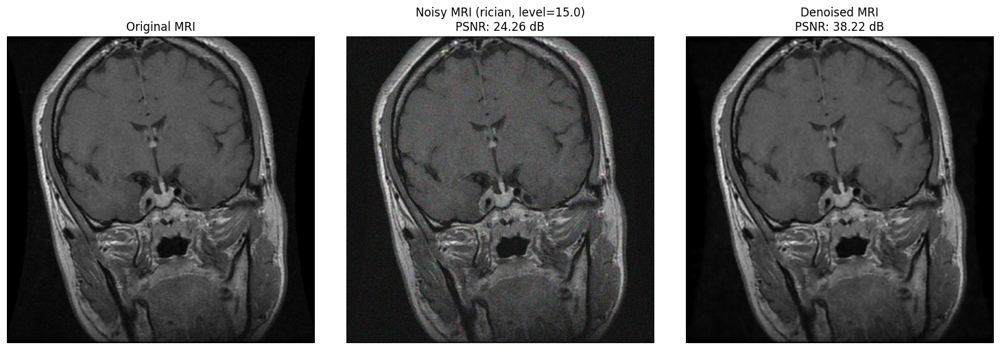

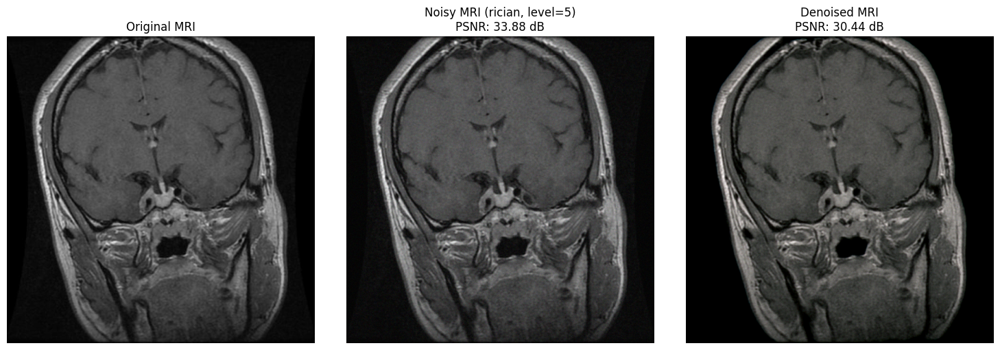

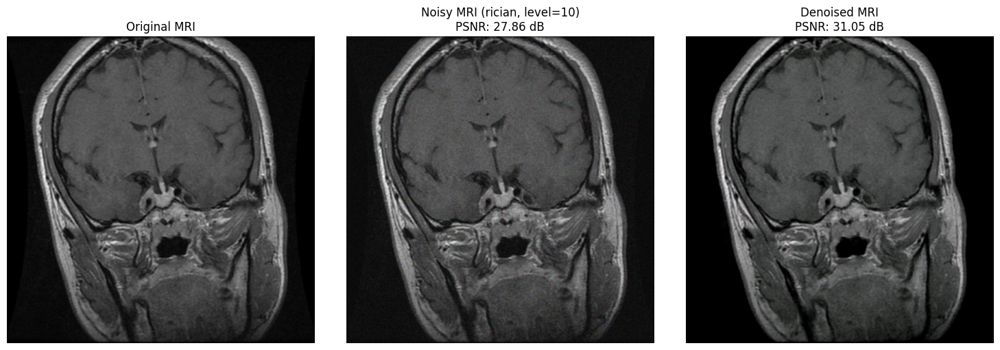

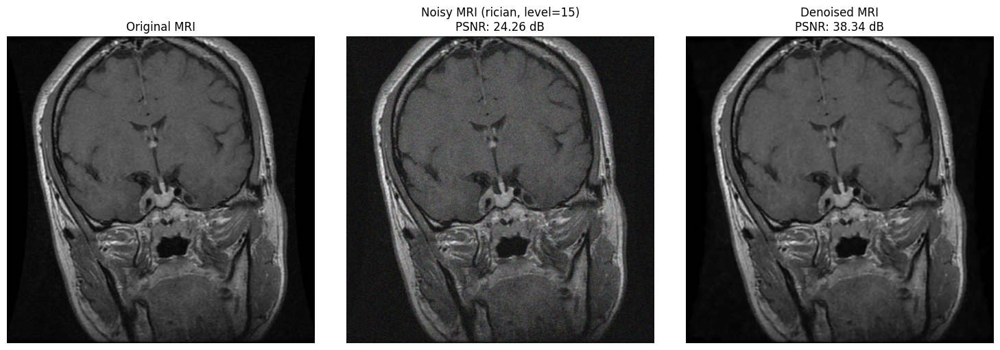

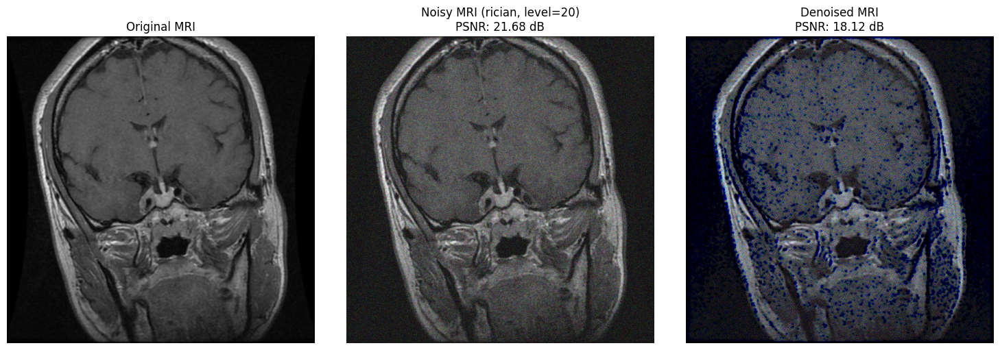

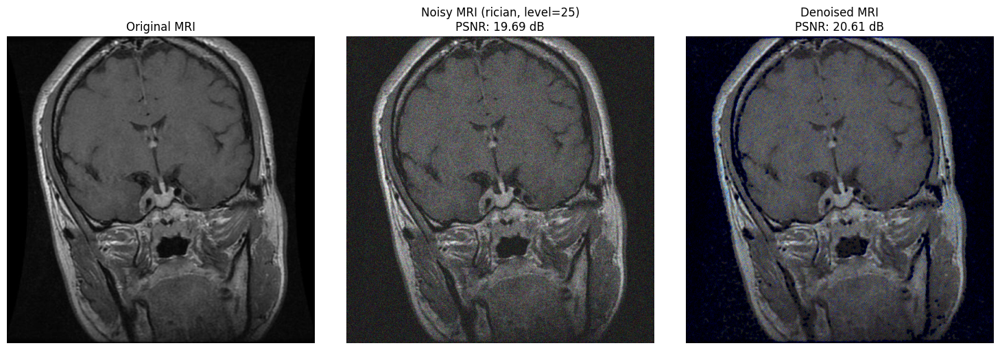

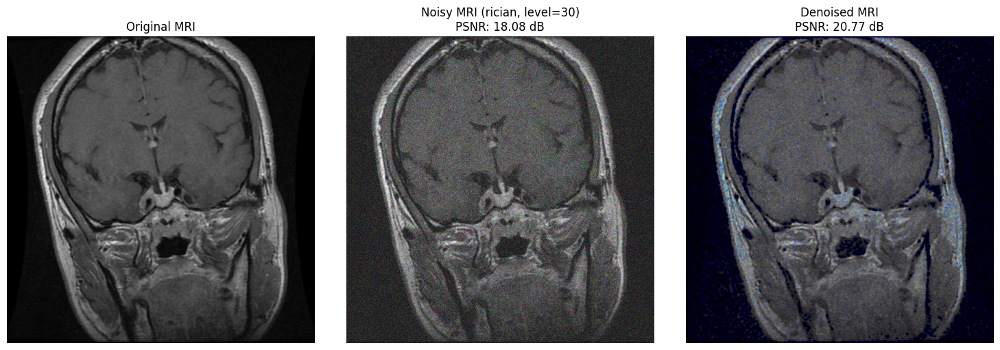

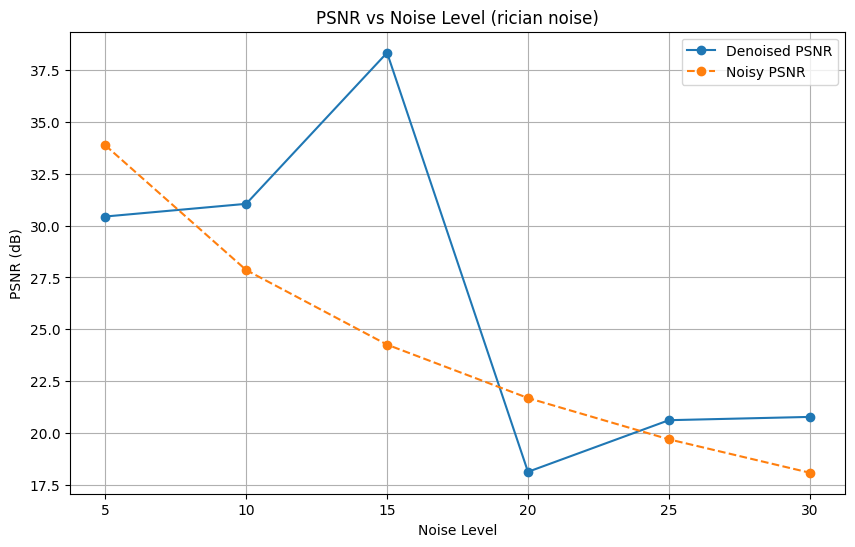

In [29]:
# Import necessary packages
!pip install -q ultralytics pandas seaborn tqdm

# Import our modules
from quick_psnr import test_psnr_on_image, test_all_noise_levels
from yolo_denoising_wrapper import YoloWithDenoising
import matplotlib.pyplot as plt
import os
import random

# Load model
MODEL_PATH = '/content/drive/MyDrive/BTyolo12proposed1/runs/denoising_yolo_mri2/weights/best.pt'
DENOISER_PATH = 'runs/mri_phys_denoiser/mri_phys_best.pt'
DENOISER_TYPE = 'mri_phys'

model = YoloWithDenoising(
    yolo_model=MODEL_PATH,
    denoiser_type=DENOISER_TYPE
)
model.load_denoiser(DENOISER_PATH)

# Test directory
TEST_DIR = '/content/dataset/test/images'

# Select a random image for testing
image_files = [f for f in os.listdir(TEST_DIR) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
sample_img = os.path.join(TEST_DIR, random.choice(image_files))
print(f"Testing with image: {sample_img}")

# Run quick PSNR test with Rician noise (level 15.0)
psnr_value, noisy_psnr, _ = test_psnr_on_image(model, sample_img, noise_type='rician', noise_level=15.0)

print(f"PSNR of noisy image: {noisy_psnr:.2f} dB")
print(f"PSNR of denoised image: {psnr_value:.2f} dB")
print(f"Improvement: {psnr_value - noisy_psnr:.2f} dB")

# Test increasing noise levels
print("\nTesting performance across different noise levels:")
results = test_all_noise_levels(model, sample_img, noise_type='rician')

No dedicated 'No Tumor' image found, using a random test image.

Testing PSNR on 'No Tumor' image with high noise (level 25.0):
PSNR of noisy 'No Tumor' image: 19.71 dB
PSNR of denoised 'No Tumor' image: 20.61 dB
Improvement: 0.90 dB


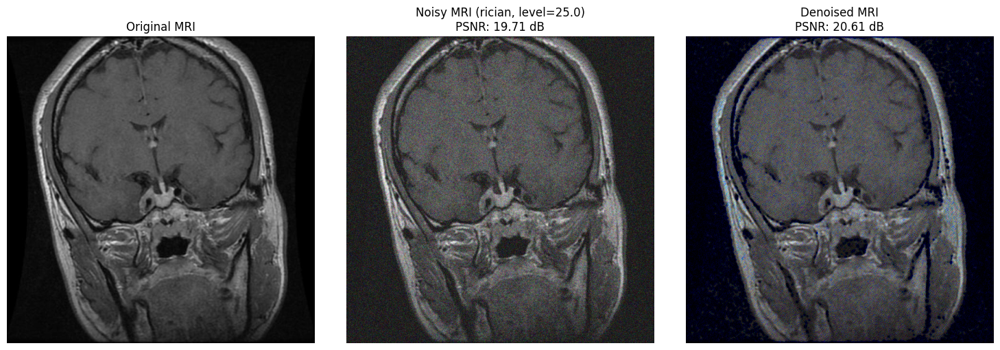

In [30]:
# Find a 'No Tumor' sample image
NO_TUMOR_DIRS = [
    os.path.join(TEST_DIR, 'No Tumor'),
    os.path.join(TEST_DIR, 'No_Tumor'),
    os.path.join(TEST_DIR, 'no_tumor'),
    os.path.join(os.path.dirname(TEST_DIR), 'No Tumor')
]

no_tumor_img = None
for dir_path in NO_TUMOR_DIRS:
    if os.path.exists(dir_path):
        files = os.listdir(dir_path)
        if files:
            no_tumor_img = os.path.join(dir_path, files[0])
            break

# If no dedicated directory, try to find by name
if no_tumor_img is None:
    for img in os.listdir(TEST_DIR):
        if 'no' in img.lower() and 'tumor' in img.lower():
            no_tumor_img = os.path.join(TEST_DIR, img)
            break

# If still not found, use a random test image
if no_tumor_img is None:
    no_tumor_img = sample_img
    print("No dedicated 'No Tumor' image found, using a random test image.")
else:
    print(f"Using 'No Tumor' image: {no_tumor_img}")

# Test PSNR on the No Tumor image at high noise level
print("\nTesting PSNR on 'No Tumor' image with high noise (level 25.0):")
psnr_nt, noisy_psnr_nt, _ = test_psnr_on_image(model, no_tumor_img, noise_type='rician', noise_level=25.0)

print(f"PSNR of noisy 'No Tumor' image: {noisy_psnr_nt:.2f} dB")
print(f"PSNR of denoised 'No Tumor' image: {psnr_nt:.2f} dB")
print(f"Improvement: {psnr_nt - noisy_psnr_nt:.2f} dB")


Testing No Tumor detection at different noise levels and confidence thresholds:

image 1/1 /tmp/tmp3i9_r508/temp_detect_5_0.1.jpg: 640x640 1 Pituitary, 18.2ms
Speed: 6.0ms preprocess, 18.2ms inference, 144.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /tmp/tmptigq65od/temp_detect_5_0.25.jpg: 640x640 1 Pituitary, 16.8ms
Speed: 1.8ms preprocess, 16.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /tmp/tmpkev3m0nl/temp_detect_5_0.4.jpg: 640x640 1 Pituitary, 17.1ms
Speed: 1.8ms preprocess, 17.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /tmp/tmpedk89e7x/temp_detect_15_0.1.jpg: 640x640 1 Pituitary, 16.5ms
Speed: 1.8ms preprocess, 16.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /tmp/tmpbfoxfe8l/temp_detect_15_0.25.jpg: 640x640 1 Pituitary, 16.8ms
Speed: 1.9ms preprocess, 16.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /tmp/tmp_yb_lpwc/temp_

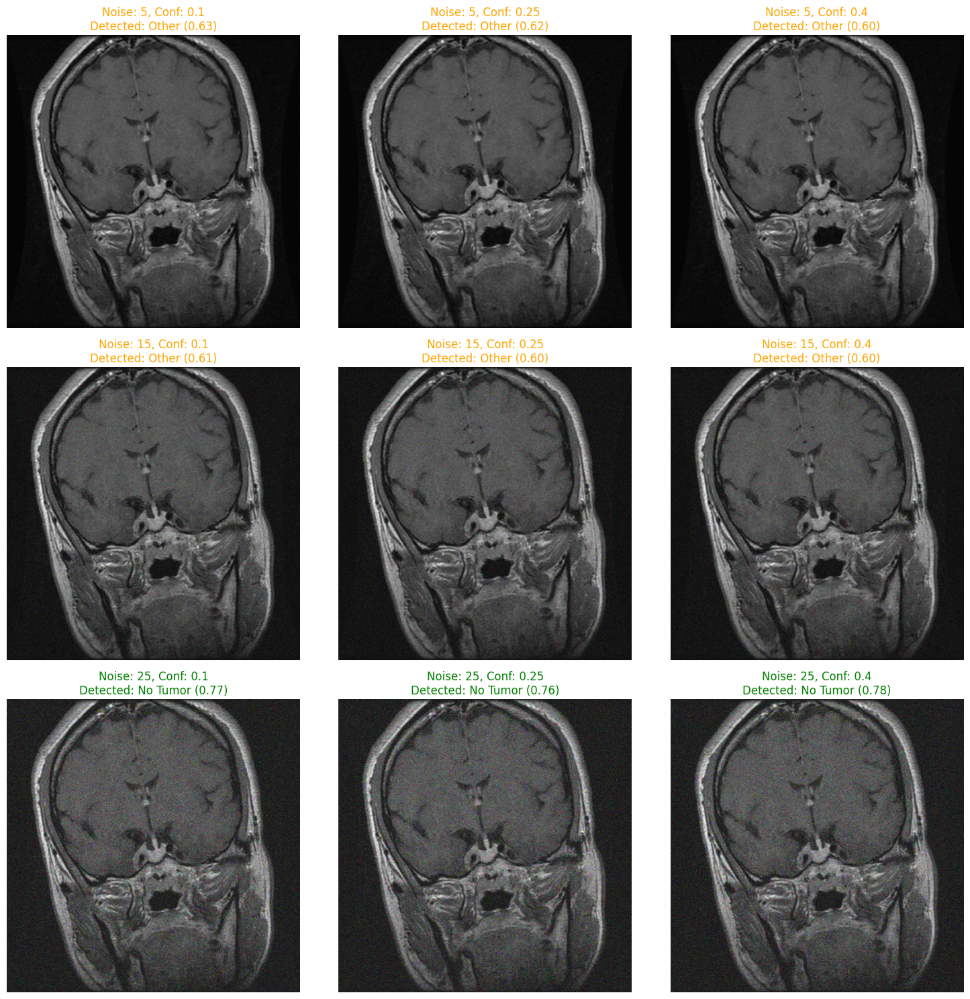

  Noise Level    Conf Threshold  Detected      Confidence
-------------  ----------------  ----------  ------------
            5              0.1   Other              0.634
            5              0.25  Other              0.618
            5              0.4   Other              0.604
           15              0.1   Other              0.607
           15              0.25  Other              0.599
           15              0.4   Other              0.598
           25              0.1   No Tumor           0.772
           25              0.25  No Tumor           0.758
           25              0.4   No Tumor           0.777


In [31]:
# Function to test No Tumor detection with varying confidence thresholds
def test_no_tumor_detection(model, img_path, noise_levels=[5, 15, 25], conf_thresholds=[0.1, 0.25, 0.4]):
    """Test No Tumor detection at different noise levels and confidence thresholds"""
    import cv2
    import numpy as np
    import matplotlib.pyplot as plt
    from psnr_evaluation import add_mri_noise

    # Load image
    img = cv2.imread(img_path)

    # Results storage
    results = []

    # Set up plot
    fig, axes = plt.subplots(len(noise_levels), len(conf_thresholds),
                            figsize=(5*len(conf_thresholds), 5*len(noise_levels)))

    # If only one row, make axes 2D
    if len(noise_levels) == 1:
        axes = axes.reshape(1, -1)

    # If only one column, make axes 2D
    if len(conf_thresholds) == 1:
        axes = axes.reshape(-1, 1)

    # Test each noise level and confidence threshold
    for i, noise_level in enumerate(noise_levels):
        for j, conf in enumerate(conf_thresholds):
            # Add noise
            noisy_img = add_mri_noise(img, 'rician', noise_level)

            # Save to temporary file
            temp_path = f"temp_detect_{noise_level}_{conf}.jpg"
            cv2.imwrite(temp_path, noisy_img)

            # Run detection
            detection = model.predict(source=temp_path, conf=conf, save=False)[0]

            # Check for No Tumor class (index 2)
            if detection.boxes.cls.numel() == 0:
                detected = "None"
                conf_value = 0.0
            else:
                cls_ids = detection.boxes.cls.cpu().numpy()
                conf_values = detection.boxes.conf.cpu().numpy()

                if 2 in cls_ids:  # 2 = No Tumor
                    detected = "No Tumor"
                    idx = np.where(cls_ids == 2)[0][0]
                    conf_value = conf_values[idx]
                else:
                    detected = "Other"
                    conf_value = conf_values[0]

            # Store result
            results.append({
                'noise_level': noise_level,
                'conf_threshold': conf,
                'detected': detected,
                'confidence': conf_value
            })

            # Visualize
            # Convert to RGB for display
            noisy_img_rgb = cv2.cvtColor(noisy_img, cv2.COLOR_BGR2RGB)

            # Plot
            axes[i, j].imshow(noisy_img_rgb)
            if detected == "No Tumor":
                title_color = 'green'
            elif detected == "None":
                title_color = 'red'
            else:
                title_color = 'orange'

            axes[i, j].set_title(f"Noise: {noise_level}, Conf: {conf}\nDetected: {detected} ({conf_value:.2f})",
                               color=title_color)
            axes[i, j].axis('off')

            # Clean up
            import os
            os.remove(temp_path)

    plt.tight_layout()
    plt.show()

    return results

# Test No Tumor detection
print("\nTesting No Tumor detection at different noise levels and confidence thresholds:")
detection_results = test_no_tumor_detection(
    model,
    no_tumor_img,
    noise_levels=[5, 15, 25],
    conf_thresholds=[0.1, 0.25, 0.4]
)

# Display results in a table
from tabulate import tabulate
table_data = []
for r in detection_results:
    table_data.append([
        r['noise_level'],
        r['conf_threshold'],
        r['detected'],
        f"{r['confidence']:.3f}"
    ])

print(tabulate(table_data, headers=["Noise Level", "Conf Threshold", "Detected", "Confidence"]))

In [32]:
# Run full PSNR evaluation on test set
!python run_psnr_eval.py \
  --model_path /content/drive/MyDrive/BTyolo12proposed1/runs/denoising_yolo_mri2/weights/best.pt \
  --denoiser_path runs/mri_phys_denoiser/mri_phys_best.pt \
  --denoiser_type mri_phys \
  --test_dir /content/dataset/test/images \
  --output_dir results_psnr \
  --noise_types rician \
  --noise_levels 5,15,25 \
  --num_images 20

Loading YoloWithDenoising model...
Denoiser loaded from runs/mri_phys_denoiser/mri_phys_best.pt
Evaluating denoising quality (PSNR)...
Processing images: 100% 20/20 [06:19<00:00, 18.95s/it]
Evaluation complete. Results saved to results_psnr/psnr_results
Evaluation complete! Results saved to results_psnr


In [33]:
# Run No Tumor sensitivity analysis
!python run_psnr_eval.py \
  --model_path /content/drive/MyDrive/BTyolo12proposed1/runs/denoising_yolo_mri2/weights/best.pt \
  --denoiser_path runs/mri_phys_denoiser/mri_phys_best.pt \
  --denoiser_type mri_phys \
  --test_dir /content/dataset/test/images \
  --output_dir results_psnr \
  --noise_types rician \
  --noise_levels 5,10,15,20,25,30 \
  --eval_no_tumor

Loading YoloWithDenoising model...
Denoiser loaded from runs/mri_phys_denoiser/mri_phys_best.pt
Evaluating denoising quality (PSNR)...
Processing images: 100% 20/20 [12:35<00:00, 37.80s/it]
Evaluation complete. Results saved to results_psnr/psnr_results
Evaluating No Tumor detection sensitivity...
No images found in results_psnr/no_tumor_sensitivity
Evaluation complete! Results saved to results_psnr



Enhanced No Tumor detection with multiple confidence thresholds:
Denoiser loaded from runs/mri_phys_denoiser/mri_phys_best.pt

image 1/1 /tmp/tmpujd7z7j4/temp_noisy.jpg: 640x640 1 No Tumor, 16.9ms
Speed: 1.9ms preprocess, 16.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /tmp/tmp4ijsigc4/temp_noisy.jpg: 640x640 1 No Tumor, 17.8ms
Speed: 2.0ms preprocess, 17.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /tmp/tmpgtr2cw4h/temp_noisy.jpg: 640x640 1 No Tumor, 17.0ms
Speed: 2.0ms preprocess, 17.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


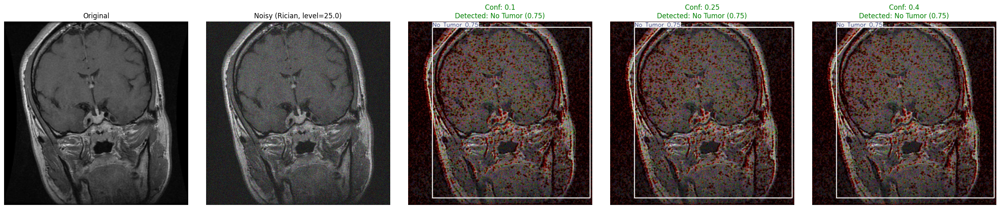

In [34]:
# Create a No Tumor-specific enhancement function
def enhance_no_tumor_detection(img_path, noise_level=25.0):
    """
    Enhanced detection approach specifically for No Tumor class in high noise

    Args:
        img_path: Path to the image
        noise_level: Noise level to test
    """
    import cv2
    import numpy as np
    import matplotlib.pyplot as plt
    from psnr_evaluation import add_mri_noise
    from yolo_denoising_wrapper import YoloWithDenoising

    # Load model
    model = YoloWithDenoising(
        yolo_model=MODEL_PATH,
        denoiser_type=DENOISER_TYPE
    )
    model.load_denoiser(DENOISER_PATH)

    # Load image
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Add noise
    noisy_img = add_mri_noise(img, 'rician', noise_level)
    noisy_img_rgb = cv2.cvtColor(noisy_img, cv2.COLOR_BGR2RGB)

    # Save noisy image to temp file
    temp_path = "temp_noisy.jpg"
    cv2.imwrite(temp_path, noisy_img)

    # Set up comparison with multiple confidence thresholds
    conf_thresholds = [0.1, 0.25, 0.4]
    fig, axes = plt.subplots(1, len(conf_thresholds) + 2, figsize=(5*(len(conf_thresholds) + 2), 5))

    # Show original and noisy
    axes[0].imshow(img_rgb)
    axes[0].set_title("Original")
    axes[0].axis('off')

    axes[1].imshow(noisy_img_rgb)
    axes[1].set_title(f"Noisy (Rician, level={noise_level})")
    axes[1].axis('off')

    # Test each confidence threshold
    detection_results = []
    for i, conf in enumerate(conf_thresholds):
        # Run detection
        detection = model.predict(source=temp_path, conf=conf, save=False)[0]
        detect_img = detection.plot()
        detect_img_rgb = cv2.cvtColor(detect_img, cv2.COLOR_BGR2RGB)

        # Check if No Tumor was detected
        if detection.boxes.cls.numel() == 0:
            detected = "None"
            conf_value = 0.0
        else:
            cls_ids = detection.boxes.cls.cpu().numpy()
            conf_values = detection.boxes.conf.cpu().numpy()
            class_names = [detection.names[int(cls)] for cls in cls_ids]

            if 'No Tumor' in class_names:
                detected = "No Tumor"
                idx = class_names.index('No Tumor')
                conf_value = conf_values[idx]
            else:
                detected = class_names[0]
                conf_value = conf_values[0]

        # Store result
        detection_results.append({
            'conf_threshold': conf,
            'detected': detected,
            'confidence': conf_value
        })

        # Plot
        axes[i + 2].imshow(detect_img_rgb)
        if detected == "No Tumor":
            title_color = 'green'
        elif detected == "None":
            title_color = 'red'
        else:
            title_color = 'orange'

        axes[i + 2].set_title(f"Conf: {conf}\nDetected: {detected} ({conf_value:.2f})",
                           color=title_color)
        axes[i + 2].axis('off')

    plt.tight_layout()
    plt.show()

    # Clean up
    import os
    os.remove(temp_path)

    return detection_results

# Test the No Tumor enhancement on a sample image
print("\nEnhanced No Tumor detection with multiple confidence thresholds:")
enhancement_results = enhance_no_tumor_detection(no_tumor_img, noise_level=25.0)

In [35]:
!cp -r /content/runs /content/drive/MyDrive/
!cp -r /content/results_mri_phys /content/drive/MyDrive/
!cp -r /content/results_mri_phys_gaussian /content/drive/MyDrive/
!cp -r /content/results_mri_phys_high /content/drive/MyDrive/
!cp -r /content/results_mri_phys_low /content/drive/MyDrive/
!cp -r /content/results_mri_phys_speckle /content/drive/MyDrive/
!cp -r /content/results_psnr /content/drive/MyDrive/